<a href="https://colab.research.google.com/github/SrAyush31/GANs/blob/main/GANs_Pokemon_Images_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **GAN on Pokemon Images Dataset**

In [48]:
!mkdir -p /root/.kaggle

In [49]:
!mv kaggle.json /root/.kaggle/

In [3]:
import kaggle

# Downloading Pokemon Images Dataset from Kagggle

In [4]:
!kaggle datasets download -d kvpratama/pokemon-images-dataset

pokemon-images-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)


In [5]:
!unzip -q /content/pokemon-images-dataset.zip

replace pokemon/pokemon/1.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [6]:
import os
data_dir = ('/content/pokemon_jpg')
print(os.listdir(data_dir))

['pokemon_jpg']


In [7]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [8]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)


In [9]:
train_ds = ImageFolder(data_dir, transform=T.Compose([T.Resize(image_size),
                                            T.CenterCrop(image_size),
                                            T.ToTensor(),
                                            T.Normalize(*stats)]))
train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [10]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [11]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]


In [12]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


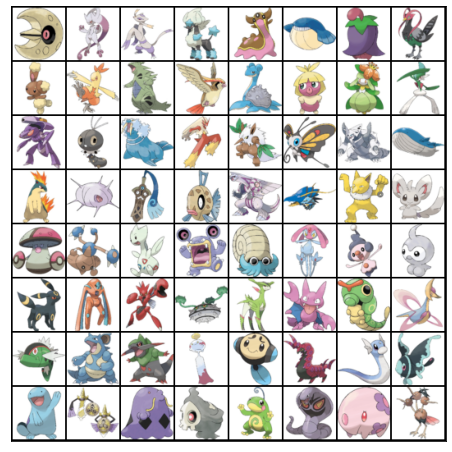

In [13]:
show_batch(train_dl)

# GPU utilities

In [14]:
import torch
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [15]:

torch.cuda.is_available()

True

In [16]:
device = get_default_device()
device

device(type='cuda')

In [17]:
train_dl = DeviceDataLoader(train_dl, device)

In [18]:
import torch.nn as nn

In [19]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [20]:
discriminator = to_device(discriminator, device)

In [21]:
latent_size = 128

In [22]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)


In [24]:
generator = to_device(generator, device)

In [25]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [26]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    # Update generator weights
    loss.backward()
    opt_g.step()
    
    return loss.item()

In [27]:
from torchvision.utils import save_image

In [28]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [29]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [30]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

In [31]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [32]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)
              # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
    
        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores

In [33]:
lr = 0.0002
epochs = 1001

In [34]:
history = fit(epochs, lr)

  0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch [1/1001], loss_g: 6.3880, loss_d: 0.4077, real_score: 0.8826, fake_score: 0.2325
Saving generated-images-0001.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [2/1001], loss_g: 7.3145, loss_d: 0.0902, real_score: 0.9425, fake_score: 0.0224
Saving generated-images-0002.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [3/1001], loss_g: 8.4653, loss_d: 0.0093, real_score: 0.9912, fake_score: 0.0003
Saving generated-images-0003.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [4/1001], loss_g: 10.8129, loss_d: 0.0275, real_score: 0.9756, fake_score: 0.0005
Saving generated-images-0004.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [5/1001], loss_g: 13.3196, loss_d: 0.0032, real_score: 0.9968, fake_score: 0.0000
Saving generated-images-0005.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [6/1001], loss_g: 13.0271, loss_d: 0.0772, real_score: 0.9964, fake_score: 0.0708
Saving generated-images-0006.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [7/1001], loss_g: 8.2264, loss_d: 0.0055, real_score: 0.9959, fake_score: 0.0014
Saving generated-images-0007.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [8/1001], loss_g: 8.4176, loss_d: 0.0277, real_score: 0.9861, fake_score: 0.0122
Saving generated-images-0008.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [9/1001], loss_g: 9.5874, loss_d: 0.0167, real_score: 0.9983, fake_score: 0.0148
Saving generated-images-0009.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [10/1001], loss_g: 9.9071, loss_d: 0.0221, real_score: 0.9917, fake_score: 0.0135
Saving generated-images-0010.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [11/1001], loss_g: 18.4279, loss_d: 0.0011, real_score: 0.9989, fake_score: 0.0000
Saving generated-images-0011.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [12/1001], loss_g: 11.6013, loss_d: 0.5581, real_score: 0.6456, fake_score: 0.0000
Saving generated-images-0012.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [13/1001], loss_g: 5.8557, loss_d: 0.0306, real_score: 0.9735, fake_score: 0.0028
Saving generated-images-0013.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [14/1001], loss_g: 6.3141, loss_d: 0.0041, real_score: 0.9976, fake_score: 0.0017
Saving generated-images-0014.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [15/1001], loss_g: 10.8293, loss_d: 0.0630, real_score: 0.9493, fake_score: 0.0000
Saving generated-images-0015.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [16/1001], loss_g: 7.8643, loss_d: 0.1298, real_score: 0.9284, fake_score: 0.0514
Saving generated-images-0016.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [17/1001], loss_g: 14.7027, loss_d: 0.2124, real_score: 0.8826, fake_score: 0.0000
Saving generated-images-0017.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [18/1001], loss_g: 4.7290, loss_d: 0.0230, real_score: 0.9975, fake_score: 0.0202
Saving generated-images-0018.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [19/1001], loss_g: 8.8967, loss_d: 0.0081, real_score: 0.9937, fake_score: 0.0015
Saving generated-images-0019.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [20/1001], loss_g: 3.9129, loss_d: 0.7114, real_score: 0.5971, fake_score: 0.0048
Saving generated-images-0020.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [21/1001], loss_g: 4.5784, loss_d: 0.3572, real_score: 0.7700, fake_score: 0.0540
Saving generated-images-0021.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [22/1001], loss_g: 4.4661, loss_d: 1.1423, real_score: 0.9319, fake_score: 0.6489
Saving generated-images-0022.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [23/1001], loss_g: 2.2184, loss_d: 0.5336, real_score: 0.7204, fake_score: 0.1616
Saving generated-images-0023.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [24/1001], loss_g: 3.6463, loss_d: 0.3200, real_score: 0.7848, fake_score: 0.0474
Saving generated-images-0024.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [25/1001], loss_g: 3.9508, loss_d: 0.4166, real_score: 0.8725, fake_score: 0.2297
Saving generated-images-0025.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [26/1001], loss_g: 4.0048, loss_d: 0.3735, real_score: 0.9413, fake_score: 0.2601
Saving generated-images-0026.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [27/1001], loss_g: 6.1067, loss_d: 0.5444, real_score: 0.8900, fake_score: 0.3305
Saving generated-images-0027.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [28/1001], loss_g: 6.8379, loss_d: 1.4721, real_score: 0.9682, fake_score: 0.7342
Saving generated-images-0028.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [29/1001], loss_g: 4.6344, loss_d: 0.1964, real_score: 0.8713, fake_score: 0.0521
Saving generated-images-0029.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [30/1001], loss_g: 5.0653, loss_d: 0.4920, real_score: 0.8871, fake_score: 0.2976
Saving generated-images-0030.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [31/1001], loss_g: 2.9061, loss_d: 0.2335, real_score: 0.8540, fake_score: 0.0642
Saving generated-images-0031.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [32/1001], loss_g: 4.2717, loss_d: 0.2526, real_score: 0.8343, fake_score: 0.0610
Saving generated-images-0032.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [33/1001], loss_g: 1.7520, loss_d: 3.0534, real_score: 0.0555, fake_score: 0.0082
Saving generated-images-0033.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [34/1001], loss_g: 2.7630, loss_d: 0.8248, real_score: 0.7951, fake_score: 0.4262
Saving generated-images-0034.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [35/1001], loss_g: 2.8751, loss_d: 0.7147, real_score: 0.6983, fake_score: 0.2659
Saving generated-images-0035.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [36/1001], loss_g: 2.9347, loss_d: 0.7692, real_score: 0.5341, fake_score: 0.0492
Saving generated-images-0036.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [37/1001], loss_g: 2.5696, loss_d: 0.5807, real_score: 0.7884, fake_score: 0.2665
Saving generated-images-0037.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [38/1001], loss_g: 2.0567, loss_d: 0.3791, real_score: 0.8942, fake_score: 0.2176
Saving generated-images-0038.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [39/1001], loss_g: 2.4069, loss_d: 0.8166, real_score: 0.5013, fake_score: 0.0261
Saving generated-images-0039.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [40/1001], loss_g: 4.0828, loss_d: 0.5662, real_score: 0.8991, fake_score: 0.3511
Saving generated-images-0040.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [41/1001], loss_g: 2.9049, loss_d: 0.6052, real_score: 0.7971, fake_score: 0.2897
Saving generated-images-0041.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [42/1001], loss_g: 5.7105, loss_d: 0.7269, real_score: 0.9189, fake_score: 0.4598
Saving generated-images-0042.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [43/1001], loss_g: 4.7179, loss_d: 0.5644, real_score: 0.9116, fake_score: 0.3630
Saving generated-images-0043.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [44/1001], loss_g: 1.7988, loss_d: 0.7612, real_score: 0.5652, fake_score: 0.1251
Saving generated-images-0044.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [45/1001], loss_g: 6.0185, loss_d: 0.7730, real_score: 0.8642, fake_score: 0.4401
Saving generated-images-0045.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [46/1001], loss_g: 2.3170, loss_d: 0.3580, real_score: 0.8164, fake_score: 0.1290
Saving generated-images-0046.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [47/1001], loss_g: 3.2413, loss_d: 0.5636, real_score: 0.7560, fake_score: 0.2309
Saving generated-images-0047.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [48/1001], loss_g: 3.3221, loss_d: 0.3704, real_score: 0.8149, fake_score: 0.1373
Saving generated-images-0048.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [49/1001], loss_g: 2.9990, loss_d: 0.5480, real_score: 0.7781, fake_score: 0.2347
Saving generated-images-0049.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [50/1001], loss_g: 5.9127, loss_d: 0.7207, real_score: 0.8550, fake_score: 0.4048
Saving generated-images-0050.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [51/1001], loss_g: 2.3362, loss_d: 0.4733, real_score: 0.7294, fake_score: 0.1221
Saving generated-images-0051.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [52/1001], loss_g: 1.7291, loss_d: 0.9465, real_score: 0.4875, fake_score: 0.0953
Saving generated-images-0052.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [53/1001], loss_g: 4.4316, loss_d: 0.6494, real_score: 0.8558, fake_score: 0.3745
Saving generated-images-0053.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [54/1001], loss_g: 3.8540, loss_d: 0.4989, real_score: 0.8581, fake_score: 0.2799
Saving generated-images-0054.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [55/1001], loss_g: 4.0465, loss_d: 0.4048, real_score: 0.9418, fake_score: 0.2763
Saving generated-images-0055.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [56/1001], loss_g: 2.9421, loss_d: 0.2663, real_score: 0.8553, fake_score: 0.1002
Saving generated-images-0056.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [57/1001], loss_g: 2.6714, loss_d: 0.3519, real_score: 0.7681, fake_score: 0.0729
Saving generated-images-0057.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [58/1001], loss_g: 2.0372, loss_d: 0.5017, real_score: 0.7043, fake_score: 0.1182
Saving generated-images-0058.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [59/1001], loss_g: 2.3097, loss_d: 0.5277, real_score: 0.6782, fake_score: 0.0954
Saving generated-images-0059.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [60/1001], loss_g: 3.2250, loss_d: 0.3883, real_score: 0.7366, fake_score: 0.0555
Saving generated-images-0060.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [61/1001], loss_g: 6.1639, loss_d: 0.6815, real_score: 0.9297, fake_score: 0.4324
Saving generated-images-0061.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [62/1001], loss_g: 3.6530, loss_d: 0.4433, real_score: 0.9275, fake_score: 0.2973
Saving generated-images-0062.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [63/1001], loss_g: 10.0732, loss_d: 1.4031, real_score: 0.9736, fake_score: 0.7245
Saving generated-images-0063.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [64/1001], loss_g: 2.6423, loss_d: 0.6929, real_score: 0.6392, fake_score: 0.1082
Saving generated-images-0064.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [65/1001], loss_g: 4.6966, loss_d: 0.5931, real_score: 0.7513, fake_score: 0.2282
Saving generated-images-0065.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [66/1001], loss_g: 0.7591, loss_d: 0.7818, real_score: 0.5213, fake_score: 0.0195
Saving generated-images-0066.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [67/1001], loss_g: 3.6602, loss_d: 0.6448, real_score: 0.9377, fake_score: 0.4041
Saving generated-images-0067.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [68/1001], loss_g: 3.4280, loss_d: 0.4626, real_score: 0.8367, fake_score: 0.2272
Saving generated-images-0068.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [69/1001], loss_g: 5.2732, loss_d: 0.5902, real_score: 0.9705, fake_score: 0.3814
Saving generated-images-0069.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [70/1001], loss_g: 3.6407, loss_d: 0.6398, real_score: 0.7901, fake_score: 0.3076
Saving generated-images-0070.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [71/1001], loss_g: 4.9273, loss_d: 0.7277, real_score: 0.9409, fake_score: 0.4556
Saving generated-images-0071.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [72/1001], loss_g: 3.5018, loss_d: 0.2485, real_score: 0.8733, fake_score: 0.0978
Saving generated-images-0072.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [73/1001], loss_g: 8.4000, loss_d: 3.1939, real_score: 0.9981, fake_score: 0.9475
Saving generated-images-0073.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [74/1001], loss_g: 3.6886, loss_d: 0.5516, real_score: 0.8137, fake_score: 0.2669
Saving generated-images-0074.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [75/1001], loss_g: 2.7682, loss_d: 0.4836, real_score: 0.8250, fake_score: 0.2340
Saving generated-images-0075.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [76/1001], loss_g: 1.6842, loss_d: 0.3879, real_score: 0.8923, fake_score: 0.2238
Saving generated-images-0076.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [77/1001], loss_g: 3.5215, loss_d: 0.4730, real_score: 0.8058, fake_score: 0.1929
Saving generated-images-0077.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [78/1001], loss_g: 2.3629, loss_d: 0.6301, real_score: 0.6098, fake_score: 0.0569
Saving generated-images-0078.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [79/1001], loss_g: 2.7719, loss_d: 0.4544, real_score: 0.7287, fake_score: 0.1005
Saving generated-images-0079.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [80/1001], loss_g: 3.1035, loss_d: 0.3387, real_score: 0.8716, fake_score: 0.1705
Saving generated-images-0080.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [81/1001], loss_g: 2.5584, loss_d: 0.2108, real_score: 0.8853, fake_score: 0.0773
Saving generated-images-0081.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [82/1001], loss_g: 2.3437, loss_d: 1.3613, real_score: 0.2952, fake_score: 0.0081
Saving generated-images-0082.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [83/1001], loss_g: 2.6537, loss_d: 0.2965, real_score: 0.9283, fake_score: 0.1893
Saving generated-images-0083.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [84/1001], loss_g: 1.2506, loss_d: 1.7186, real_score: 0.2300, fake_score: 0.0089
Saving generated-images-0084.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [85/1001], loss_g: 3.4935, loss_d: 0.4475, real_score: 0.8005, fake_score: 0.1790
Saving generated-images-0085.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [86/1001], loss_g: 4.7690, loss_d: 0.6576, real_score: 0.8723, fake_score: 0.3767
Saving generated-images-0086.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [87/1001], loss_g: 2.8634, loss_d: 0.4772, real_score: 0.8319, fake_score: 0.2320
Saving generated-images-0087.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [88/1001], loss_g: 3.7547, loss_d: 0.3194, real_score: 0.8826, fake_score: 0.1644
Saving generated-images-0088.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [89/1001], loss_g: 0.1450, loss_d: 2.3766, real_score: 0.1307, fake_score: 0.0016
Saving generated-images-0089.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [90/1001], loss_g: 3.1699, loss_d: 0.5206, real_score: 0.8877, fake_score: 0.3043
Saving generated-images-0090.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [91/1001], loss_g: 3.4060, loss_d: 0.4631, real_score: 0.9159, fake_score: 0.2899
Saving generated-images-0091.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [92/1001], loss_g: 3.1353, loss_d: 0.4222, real_score: 0.9028, fake_score: 0.2572
Saving generated-images-0092.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [93/1001], loss_g: 3.1855, loss_d: 0.3420, real_score: 0.8428, fake_score: 0.1434
Saving generated-images-0093.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [94/1001], loss_g: 6.8886, loss_d: 1.5269, real_score: 0.9920, fake_score: 0.7383
Saving generated-images-0094.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [95/1001], loss_g: 1.9189, loss_d: 0.6434, real_score: 0.6341, fake_score: 0.1185
Saving generated-images-0095.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [96/1001], loss_g: 2.7890, loss_d: 0.4387, real_score: 0.7413, fake_score: 0.1081
Saving generated-images-0096.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [97/1001], loss_g: 6.2032, loss_d: 1.0066, real_score: 0.9755, fake_score: 0.5943
Saving generated-images-0097.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [98/1001], loss_g: 5.2801, loss_d: 0.7252, real_score: 0.8920, fake_score: 0.4265
Saving generated-images-0098.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [99/1001], loss_g: 2.8534, loss_d: 0.4915, real_score: 0.7809, fake_score: 0.1925
Saving generated-images-0099.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [100/1001], loss_g: 2.6889, loss_d: 0.3862, real_score: 0.9703, fake_score: 0.2714
Saving generated-images-0100.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [101/1001], loss_g: 2.1560, loss_d: 0.6562, real_score: 0.5836, fake_score: 0.0416
Saving generated-images-0101.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [102/1001], loss_g: 2.6530, loss_d: 0.5061, real_score: 0.7798, fake_score: 0.2032
Saving generated-images-0102.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [103/1001], loss_g: 2.3001, loss_d: 0.4359, real_score: 0.7337, fake_score: 0.0869
Saving generated-images-0103.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [104/1001], loss_g: 2.8136, loss_d: 0.5038, real_score: 0.7785, fake_score: 0.1993
Saving generated-images-0104.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [105/1001], loss_g: 8.4128, loss_d: 1.9338, real_score: 0.9915, fake_score: 0.8065
Saving generated-images-0105.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [106/1001], loss_g: 3.5974, loss_d: 0.5708, real_score: 0.9064, fake_score: 0.3558
Saving generated-images-0106.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [107/1001], loss_g: 3.7588, loss_d: 0.5836, real_score: 0.8253, fake_score: 0.2911
Saving generated-images-0107.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [108/1001], loss_g: 3.7150, loss_d: 0.3988, real_score: 0.8718, fake_score: 0.2128
Saving generated-images-0108.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [109/1001], loss_g: 3.9935, loss_d: 0.5490, real_score: 0.8067, fake_score: 0.2605
Saving generated-images-0109.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [110/1001], loss_g: 5.3123, loss_d: 0.7859, real_score: 0.9625, fake_score: 0.4692
Saving generated-images-0110.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [111/1001], loss_g: 3.5778, loss_d: 0.3494, real_score: 0.8698, fake_score: 0.1765
Saving generated-images-0111.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [112/1001], loss_g: 2.5454, loss_d: 0.4304, real_score: 0.7667, fake_score: 0.1243
Saving generated-images-0112.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [113/1001], loss_g: 2.6415, loss_d: 0.3165, real_score: 0.8096, fake_score: 0.0821
Saving generated-images-0113.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [114/1001], loss_g: 2.7630, loss_d: 0.3785, real_score: 0.7738, fake_score: 0.0974
Saving generated-images-0114.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [115/1001], loss_g: 2.9295, loss_d: 0.3897, real_score: 0.7830, fake_score: 0.0968
Saving generated-images-0115.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [116/1001], loss_g: 3.4477, loss_d: 0.5044, real_score: 0.7990, fake_score: 0.2184
Saving generated-images-0116.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [117/1001], loss_g: 0.5548, loss_d: 2.0347, real_score: 0.1853, fake_score: 0.0027
Saving generated-images-0117.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [118/1001], loss_g: 3.6899, loss_d: 0.7699, real_score: 0.8301, fake_score: 0.4023
Saving generated-images-0118.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [119/1001], loss_g: 4.0867, loss_d: 0.6454, real_score: 0.8519, fake_score: 0.3421
Saving generated-images-0119.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [120/1001], loss_g: 3.0473, loss_d: 0.4357, real_score: 0.7403, fake_score: 0.0932
Saving generated-images-0120.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [121/1001], loss_g: 5.3757, loss_d: 0.6984, real_score: 0.8823, fake_score: 0.3930
Saving generated-images-0121.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [122/1001], loss_g: 3.4356, loss_d: 0.5001, real_score: 0.8451, fake_score: 0.2493
Saving generated-images-0122.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [123/1001], loss_g: 2.1305, loss_d: 0.4592, real_score: 0.7266, fake_score: 0.0829
Saving generated-images-0123.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [124/1001], loss_g: 5.3478, loss_d: 0.7642, real_score: 0.9648, fake_score: 0.4615
Saving generated-images-0124.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [125/1001], loss_g: 4.5322, loss_d: 0.5222, real_score: 0.9040, fake_score: 0.3068
Saving generated-images-0125.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [126/1001], loss_g: 1.7569, loss_d: 0.5719, real_score: 0.6473, fake_score: 0.0752
Saving generated-images-0126.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [127/1001], loss_g: 2.8862, loss_d: 0.4007, real_score: 0.7793, fake_score: 0.1071
Saving generated-images-0127.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [128/1001], loss_g: 2.7985, loss_d: 0.5243, real_score: 0.7585, fake_score: 0.1848
Saving generated-images-0128.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [129/1001], loss_g: 5.2341, loss_d: 0.5350, real_score: 0.9079, fake_score: 0.3283
Saving generated-images-0129.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [130/1001], loss_g: 2.8561, loss_d: 0.5084, real_score: 0.8411, fake_score: 0.2492
Saving generated-images-0130.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [131/1001], loss_g: 2.7493, loss_d: 0.3643, real_score: 0.7718, fake_score: 0.0818
Saving generated-images-0131.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [132/1001], loss_g: 5.3477, loss_d: 0.6613, real_score: 0.9393, fake_score: 0.4141
Saving generated-images-0132.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [133/1001], loss_g: 3.3345, loss_d: 0.4329, real_score: 0.8868, fake_score: 0.2492
Saving generated-images-0133.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [134/1001], loss_g: 5.5537, loss_d: 0.5974, real_score: 0.9377, fake_score: 0.3740
Saving generated-images-0134.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [135/1001], loss_g: 4.7705, loss_d: 0.5124, real_score: 0.9600, fake_score: 0.3445
Saving generated-images-0135.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [136/1001], loss_g: 2.0043, loss_d: 0.4083, real_score: 0.7445, fake_score: 0.0783
Saving generated-images-0136.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [137/1001], loss_g: 1.6719, loss_d: 0.6920, real_score: 0.5640, fake_score: 0.0238
Saving generated-images-0137.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [138/1001], loss_g: 2.9018, loss_d: 0.3782, real_score: 0.8119, fake_score: 0.1254
Saving generated-images-0138.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [139/1001], loss_g: 3.7916, loss_d: 0.3399, real_score: 0.9381, fake_score: 0.2156
Saving generated-images-0139.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [140/1001], loss_g: 4.2407, loss_d: 0.6214, real_score: 0.9720, fake_score: 0.3946
Saving generated-images-0140.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [141/1001], loss_g: 4.4402, loss_d: 0.6598, real_score: 0.9686, fake_score: 0.4169
Saving generated-images-0141.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [142/1001], loss_g: 3.0008, loss_d: 0.3367, real_score: 0.8590, fake_score: 0.1482
Saving generated-images-0142.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [143/1001], loss_g: 7.5730, loss_d: 0.9688, real_score: 0.9830, fake_score: 0.5553
Saving generated-images-0143.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [144/1001], loss_g: 2.7257, loss_d: 0.3934, real_score: 0.7554, fake_score: 0.0808
Saving generated-images-0144.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [145/1001], loss_g: 0.9091, loss_d: 1.0222, real_score: 0.4256, fake_score: 0.0149
Saving generated-images-0145.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [146/1001], loss_g: 3.6627, loss_d: 0.5181, real_score: 0.8148, fake_score: 0.2268
Saving generated-images-0146.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [147/1001], loss_g: 3.7785, loss_d: 0.3786, real_score: 0.8499, fake_score: 0.1705
Saving generated-images-0147.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [148/1001], loss_g: 4.2567, loss_d: 0.4099, real_score: 0.8988, fake_score: 0.2374
Saving generated-images-0148.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [149/1001], loss_g: 3.3424, loss_d: 0.2807, real_score: 0.8065, fake_score: 0.0467
Saving generated-images-0149.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [150/1001], loss_g: 8.4329, loss_d: 0.9663, real_score: 0.9842, fake_score: 0.5486
Saving generated-images-0150.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [151/1001], loss_g: 2.8286, loss_d: 0.4216, real_score: 0.8147, fake_score: 0.1617
Saving generated-images-0151.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [152/1001], loss_g: 3.7857, loss_d: 0.3168, real_score: 0.8655, fake_score: 0.1377
Saving generated-images-0152.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [153/1001], loss_g: 4.0730, loss_d: 0.2625, real_score: 0.8902, fake_score: 0.1201
Saving generated-images-0153.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [154/1001], loss_g: 12.3765, loss_d: 1.6165, real_score: 0.9962, fake_score: 0.7352
Saving generated-images-0154.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [155/1001], loss_g: 3.6311, loss_d: 0.7127, real_score: 0.8698, fake_score: 0.3537
Saving generated-images-0155.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [156/1001], loss_g: 3.6406, loss_d: 0.4864, real_score: 0.7983, fake_score: 0.1899
Saving generated-images-0156.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [157/1001], loss_g: 4.3909, loss_d: 0.5825, real_score: 0.9047, fake_score: 0.3470
Saving generated-images-0157.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [158/1001], loss_g: 3.4604, loss_d: 0.3258, real_score: 0.8601, fake_score: 0.1372
Saving generated-images-0158.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [159/1001], loss_g: 2.6663, loss_d: 0.3671, real_score: 0.7804, fake_score: 0.0826
Saving generated-images-0159.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [160/1001], loss_g: 3.2091, loss_d: 0.2549, real_score: 0.8466, fake_score: 0.0701
Saving generated-images-0160.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [161/1001], loss_g: 3.1438, loss_d: 0.4835, real_score: 0.6586, fake_score: 0.0164
Saving generated-images-0161.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [162/1001], loss_g: 6.3026, loss_d: 0.5892, real_score: 0.9627, fake_score: 0.3767
Saving generated-images-0162.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [163/1001], loss_g: 2.0335, loss_d: 0.5115, real_score: 0.6799, fake_score: 0.0427
Saving generated-images-0163.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [164/1001], loss_g: 3.4988, loss_d: 0.3074, real_score: 0.7960, fake_score: 0.0514
Saving generated-images-0164.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [165/1001], loss_g: 6.0302, loss_d: 0.4183, real_score: 0.9550, fake_score: 0.2805
Saving generated-images-0165.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [166/1001], loss_g: 5.5298, loss_d: 0.3623, real_score: 0.9385, fake_score: 0.2360
Saving generated-images-0166.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [167/1001], loss_g: 4.5623, loss_d: 0.3152, real_score: 0.9657, fake_score: 0.2216
Saving generated-images-0167.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [168/1001], loss_g: 8.2579, loss_d: 1.1439, real_score: 0.9957, fake_score: 0.5991
Saving generated-images-0168.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [169/1001], loss_g: 3.3234, loss_d: 0.3400, real_score: 0.8275, fake_score: 0.1119
Saving generated-images-0169.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [170/1001], loss_g: 3.1270, loss_d: 0.3229, real_score: 0.8021, fake_score: 0.0695
Saving generated-images-0170.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [171/1001], loss_g: 4.6825, loss_d: 0.2669, real_score: 0.9202, fake_score: 0.1526
Saving generated-images-0171.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [172/1001], loss_g: 3.1037, loss_d: 0.2398, real_score: 0.8335, fake_score: 0.0459
Saving generated-images-0172.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [173/1001], loss_g: 2.5415, loss_d: 0.2976, real_score: 0.8013, fake_score: 0.0470
Saving generated-images-0173.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [174/1001], loss_g: 4.0956, loss_d: 0.2951, real_score: 0.8916, fake_score: 0.1382
Saving generated-images-0174.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [175/1001], loss_g: 3.3450, loss_d: 0.2492, real_score: 0.9152, fake_score: 0.1359
Saving generated-images-0175.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [176/1001], loss_g: 6.5795, loss_d: 0.2606, real_score: 0.9668, fake_score: 0.1866
Saving generated-images-0176.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [177/1001], loss_g: 1.3009, loss_d: 2.5635, real_score: 0.1715, fake_score: 0.0024
Saving generated-images-0177.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [178/1001], loss_g: 4.2314, loss_d: 0.6955, real_score: 0.7600, fake_score: 0.2658
Saving generated-images-0178.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [179/1001], loss_g: 3.7165, loss_d: 0.5717, real_score: 0.7675, fake_score: 0.1814
Saving generated-images-0179.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [180/1001], loss_g: 3.3575, loss_d: 0.4595, real_score: 0.7693, fake_score: 0.1145
Saving generated-images-0180.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [181/1001], loss_g: 3.4130, loss_d: 0.3023, real_score: 0.8664, fake_score: 0.1207
Saving generated-images-0181.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [182/1001], loss_g: 4.3023, loss_d: 0.2447, real_score: 0.8964, fake_score: 0.1061
Saving generated-images-0182.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [183/1001], loss_g: 3.1834, loss_d: 0.2839, real_score: 0.8134, fake_score: 0.0583
Saving generated-images-0183.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [184/1001], loss_g: 3.8610, loss_d: 0.2027, real_score: 0.8886, fake_score: 0.0683
Saving generated-images-0184.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [185/1001], loss_g: 3.4129, loss_d: 0.2191, real_score: 0.8782, fake_score: 0.0757
Saving generated-images-0185.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [186/1001], loss_g: 1.9343, loss_d: 0.6251, real_score: 0.5762, fake_score: 0.0072
Saving generated-images-0186.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [187/1001], loss_g: 4.1563, loss_d: 0.3428, real_score: 0.9018, fake_score: 0.1825
Saving generated-images-0187.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [188/1001], loss_g: 3.4536, loss_d: 0.2356, real_score: 0.8588, fake_score: 0.0663
Saving generated-images-0188.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [189/1001], loss_g: 4.7456, loss_d: 0.2153, real_score: 0.9361, fake_score: 0.1292
Saving generated-images-0189.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [190/1001], loss_g: 3.4468, loss_d: 0.1769, real_score: 0.8775, fake_score: 0.0331
Saving generated-images-0190.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [191/1001], loss_g: 3.6364, loss_d: 0.1789, real_score: 0.9046, fake_score: 0.0644
Saving generated-images-0191.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [192/1001], loss_g: 0.5345, loss_d: 1.1986, real_score: 0.3593, fake_score: 0.0021
Saving generated-images-0192.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [193/1001], loss_g: 2.8096, loss_d: 0.6179, real_score: 0.7071, fake_score: 0.1374
Saving generated-images-0193.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [194/1001], loss_g: 2.9749, loss_d: 0.4952, real_score: 0.7358, fake_score: 0.1018
Saving generated-images-0194.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [195/1001], loss_g: 4.3299, loss_d: 0.3312, real_score: 0.8985, fake_score: 0.1728
Saving generated-images-0195.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [196/1001], loss_g: 3.5719, loss_d: 0.2348, real_score: 0.8722, fake_score: 0.0766
Saving generated-images-0196.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [197/1001], loss_g: 3.6664, loss_d: 0.1901, real_score: 0.8924, fake_score: 0.0645
Saving generated-images-0197.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [198/1001], loss_g: 3.8812, loss_d: 0.2287, real_score: 0.9103, fake_score: 0.1140
Saving generated-images-0198.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [199/1001], loss_g: 3.1951, loss_d: 0.2576, real_score: 0.8137, fake_score: 0.0252
Saving generated-images-0199.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [200/1001], loss_g: 2.6697, loss_d: 0.2258, real_score: 0.8463, fake_score: 0.0451
Saving generated-images-0200.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [201/1001], loss_g: 4.1175, loss_d: 0.1691, real_score: 0.9451, fake_score: 0.1004
Saving generated-images-0201.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [202/1001], loss_g: 3.5111, loss_d: 0.1741, real_score: 0.9010, fake_score: 0.0560
Saving generated-images-0202.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [203/1001], loss_g: 3.4789, loss_d: 0.1691, real_score: 0.9179, fake_score: 0.0720
Saving generated-images-0203.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [204/1001], loss_g: 3.4653, loss_d: 0.1846, real_score: 0.9010, fake_score: 0.0666
Saving generated-images-0204.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [205/1001], loss_g: 4.5367, loss_d: 0.1305, real_score: 0.9216, fake_score: 0.0437
Saving generated-images-0205.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [206/1001], loss_g: 2.1002, loss_d: 0.2313, real_score: 0.8221, fake_score: 0.0192
Saving generated-images-0206.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [207/1001], loss_g: 3.0767, loss_d: 0.3171, real_score: 0.8167, fake_score: 0.0743
Saving generated-images-0207.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [208/1001], loss_g: 3.8229, loss_d: 0.2644, real_score: 0.8318, fake_score: 0.0491
Saving generated-images-0208.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [209/1001], loss_g: 4.2239, loss_d: 0.1713, real_score: 0.9370, fake_score: 0.0946
Saving generated-images-0209.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [210/1001], loss_g: 4.9301, loss_d: 0.2055, real_score: 0.9546, fake_score: 0.1320
Saving generated-images-0210.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [211/1001], loss_g: 3.6732, loss_d: 0.1783, real_score: 0.9023, fake_score: 0.0594
Saving generated-images-0211.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [212/1001], loss_g: 4.1197, loss_d: 0.1875, real_score: 0.9401, fake_score: 0.1071
Saving generated-images-0212.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [213/1001], loss_g: 3.9025, loss_d: 0.1567, real_score: 0.9262, fake_score: 0.0707
Saving generated-images-0213.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [214/1001], loss_g: 4.5587, loss_d: 0.1066, real_score: 0.9551, fake_score: 0.0557
Saving generated-images-0214.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [215/1001], loss_g: 5.2186, loss_d: 0.1529, real_score: 0.9686, fake_score: 0.1076
Saving generated-images-0215.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [216/1001], loss_g: 3.7452, loss_d: 0.1133, real_score: 0.9339, fake_score: 0.0408
Saving generated-images-0216.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [217/1001], loss_g: 4.6355, loss_d: 0.0897, real_score: 0.9668, fake_score: 0.0522
Saving generated-images-0217.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [218/1001], loss_g: 3.6467, loss_d: 0.1246, real_score: 0.9348, fake_score: 0.0515
Saving generated-images-0218.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [219/1001], loss_g: 4.1021, loss_d: 0.0920, real_score: 0.9528, fake_score: 0.0399
Saving generated-images-0219.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [220/1001], loss_g: 3.1028, loss_d: 0.1322, real_score: 0.9146, fake_score: 0.0365
Saving generated-images-0220.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [221/1001], loss_g: 3.2540, loss_d: 0.1425, real_score: 0.9076, fake_score: 0.0387
Saving generated-images-0221.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [222/1001], loss_g: 4.3979, loss_d: 0.1136, real_score: 0.9150, fake_score: 0.0205
Saving generated-images-0222.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [223/1001], loss_g: 3.6625, loss_d: 0.1383, real_score: 0.9166, fake_score: 0.0451
Saving generated-images-0223.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [224/1001], loss_g: 4.0921, loss_d: 0.0969, real_score: 0.9450, fake_score: 0.0370
Saving generated-images-0224.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [225/1001], loss_g: 12.0087, loss_d: 0.6708, real_score: 0.9971, fake_score: 0.4342
Saving generated-images-0225.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [226/1001], loss_g: 3.0369, loss_d: 1.0959, real_score: 0.4858, fake_score: 0.0444
Saving generated-images-0226.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [227/1001], loss_g: 4.4821, loss_d: 0.5611, real_score: 0.8222, fake_score: 0.2318
Saving generated-images-0227.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [228/1001], loss_g: 4.7120, loss_d: 0.4118, real_score: 0.8641, fake_score: 0.1743
Saving generated-images-0228.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [229/1001], loss_g: 4.2688, loss_d: 0.2693, real_score: 0.8719, fake_score: 0.0992
Saving generated-images-0229.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [230/1001], loss_g: 4.0983, loss_d: 0.2150, real_score: 0.8881, fake_score: 0.0787
Saving generated-images-0230.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [231/1001], loss_g: 4.6888, loss_d: 0.1633, real_score: 0.9500, fake_score: 0.0981
Saving generated-images-0231.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [232/1001], loss_g: 4.3628, loss_d: 0.2149, real_score: 0.8913, fake_score: 0.0842
Saving generated-images-0232.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [233/1001], loss_g: 4.3310, loss_d: 0.1229, real_score: 0.9565, fake_score: 0.0718
Saving generated-images-0233.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [234/1001], loss_g: 4.3121, loss_d: 0.1129, real_score: 0.9523, fake_score: 0.0582
Saving generated-images-0234.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [235/1001], loss_g: 4.1979, loss_d: 0.1002, real_score: 0.9532, fake_score: 0.0485
Saving generated-images-0235.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [236/1001], loss_g: 4.1914, loss_d: 0.1400, real_score: 0.9227, fake_score: 0.0538
Saving generated-images-0236.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [237/1001], loss_g: 4.4947, loss_d: 0.1191, real_score: 0.9642, fake_score: 0.0758
Saving generated-images-0237.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [238/1001], loss_g: 4.2728, loss_d: 0.0920, real_score: 0.9590, fake_score: 0.0469
Saving generated-images-0238.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [239/1001], loss_g: 4.1513, loss_d: 0.0888, real_score: 0.9541, fake_score: 0.0386
Saving generated-images-0239.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [240/1001], loss_g: 5.1498, loss_d: 0.1281, real_score: 0.9658, fake_score: 0.0829
Saving generated-images-0240.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [241/1001], loss_g: 4.5945, loss_d: 0.0944, real_score: 0.9805, fake_score: 0.0698
Saving generated-images-0241.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [242/1001], loss_g: 4.8943, loss_d: 0.1159, real_score: 0.9725, fake_score: 0.0753
Saving generated-images-0242.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [243/1001], loss_g: 4.1065, loss_d: 0.1056, real_score: 0.9390, fake_score: 0.0390
Saving generated-images-0243.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [244/1001], loss_g: 2.7326, loss_d: 0.1367, real_score: 0.9074, fake_score: 0.0353
Saving generated-images-0244.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [245/1001], loss_g: 4.0788, loss_d: 0.0952, real_score: 0.9553, fake_score: 0.0449
Saving generated-images-0245.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [246/1001], loss_g: 4.3661, loss_d: 0.0794, real_score: 0.9655, fake_score: 0.0417
Saving generated-images-0246.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [247/1001], loss_g: 4.7977, loss_d: 0.1004, real_score: 0.9715, fake_score: 0.0657
Saving generated-images-0247.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [248/1001], loss_g: 4.0985, loss_d: 0.0813, real_score: 0.9651, fake_score: 0.0425
Saving generated-images-0248.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [249/1001], loss_g: 4.8120, loss_d: 0.0753, real_score: 0.9777, fake_score: 0.0500
Saving generated-images-0249.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [250/1001], loss_g: 4.8452, loss_d: 0.0831, real_score: 0.9557, fake_score: 0.0356
Saving generated-images-0250.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [251/1001], loss_g: 4.1364, loss_d: 0.0725, real_score: 0.9644, fake_score: 0.0343
Saving generated-images-0251.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [252/1001], loss_g: 4.2040, loss_d: 0.0749, real_score: 0.9576, fake_score: 0.0298
Saving generated-images-0252.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [253/1001], loss_g: 3.8064, loss_d: 0.0804, real_score: 0.9526, fake_score: 0.0302
Saving generated-images-0253.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [254/1001], loss_g: 5.2238, loss_d: 0.0797, real_score: 0.9809, fake_score: 0.0550
Saving generated-images-0254.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [255/1001], loss_g: 4.8696, loss_d: 0.0808, real_score: 0.9772, fake_score: 0.0541
Saving generated-images-0255.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [256/1001], loss_g: 3.9748, loss_d: 0.0773, real_score: 0.9610, fake_score: 0.0356
Saving generated-images-0256.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [257/1001], loss_g: 4.0710, loss_d: 0.0796, real_score: 0.9591, fake_score: 0.0357
Saving generated-images-0257.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [258/1001], loss_g: 4.3854, loss_d: 0.0659, real_score: 0.9748, fake_score: 0.0381
Saving generated-images-0258.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [259/1001], loss_g: 4.7278, loss_d: 0.0961, real_score: 0.9758, fake_score: 0.0639
Saving generated-images-0259.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [260/1001], loss_g: 3.5324, loss_d: 0.0865, real_score: 0.9361, fake_score: 0.0189
Saving generated-images-0260.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [261/1001], loss_g: 5.5539, loss_d: 0.1152, real_score: 0.9833, fake_score: 0.0866
Saving generated-images-0261.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [262/1001], loss_g: 3.5714, loss_d: 0.0898, real_score: 0.9559, fake_score: 0.0411
Saving generated-images-0262.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [263/1001], loss_g: 0.6928, loss_d: 0.6846, real_score: 0.7034, fake_score: 0.1648
Saving generated-images-0263.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [264/1001], loss_g: 3.7622, loss_d: 0.5676, real_score: 0.7221, fake_score: 0.1342
Saving generated-images-0264.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [265/1001], loss_g: 4.2641, loss_d: 0.3231, real_score: 0.7943, fake_score: 0.0559
Saving generated-images-0265.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [266/1001], loss_g: 4.0198, loss_d: 0.2557, real_score: 0.8690, fake_score: 0.0748
Saving generated-images-0266.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [267/1001], loss_g: 6.0620, loss_d: 0.2780, real_score: 0.9557, fake_score: 0.1755
Saving generated-images-0267.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [268/1001], loss_g: 4.5465, loss_d: 0.1585, real_score: 0.9421, fake_score: 0.0834
Saving generated-images-0268.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [269/1001], loss_g: 4.4062, loss_d: 0.1057, real_score: 0.9534, fake_score: 0.0519
Saving generated-images-0269.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [270/1001], loss_g: 4.6084, loss_d: 0.0896, real_score: 0.9549, fake_score: 0.0405
Saving generated-images-0270.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [271/1001], loss_g: 4.8741, loss_d: 0.0822, real_score: 0.9719, fake_score: 0.0503
Saving generated-images-0271.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [272/1001], loss_g: 4.3752, loss_d: 0.0978, real_score: 0.9559, fake_score: 0.0486
Saving generated-images-0272.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [273/1001], loss_g: 4.7815, loss_d: 0.0888, real_score: 0.9535, fake_score: 0.0378
Saving generated-images-0273.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [274/1001], loss_g: 4.7321, loss_d: 0.0641, real_score: 0.9755, fake_score: 0.0367
Saving generated-images-0274.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [275/1001], loss_g: 4.0211, loss_d: 0.0856, real_score: 0.9387, fake_score: 0.0206
Saving generated-images-0275.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [276/1001], loss_g: 4.9133, loss_d: 0.0663, real_score: 0.9698, fake_score: 0.0339
Saving generated-images-0276.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [277/1001], loss_g: 4.7797, loss_d: 0.0963, real_score: 0.9618, fake_score: 0.0538
Saving generated-images-0277.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [278/1001], loss_g: 3.9112, loss_d: 0.0774, real_score: 0.9515, fake_score: 0.0246
Saving generated-images-0278.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [279/1001], loss_g: 4.2229, loss_d: 0.0715, real_score: 0.9518, fake_score: 0.0208
Saving generated-images-0279.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [280/1001], loss_g: 4.3002, loss_d: 0.0676, real_score: 0.9701, fake_score: 0.0353
Saving generated-images-0280.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [281/1001], loss_g: 4.3861, loss_d: 0.0815, real_score: 0.9595, fake_score: 0.0378
Saving generated-images-0281.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [282/1001], loss_g: 4.3447, loss_d: 0.0679, real_score: 0.9692, fake_score: 0.0346
Saving generated-images-0282.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [283/1001], loss_g: 4.3121, loss_d: 0.0659, real_score: 0.9591, fake_score: 0.0229
Saving generated-images-0283.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [284/1001], loss_g: 4.7619, loss_d: 0.0723, real_score: 0.9681, fake_score: 0.0374
Saving generated-images-0284.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [285/1001], loss_g: 4.7507, loss_d: 0.0511, real_score: 0.9804, fake_score: 0.0301
Saving generated-images-0285.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [286/1001], loss_g: 3.8349, loss_d: 0.0756, real_score: 0.9479, fake_score: 0.0209
Saving generated-images-0286.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [287/1001], loss_g: 4.9778, loss_d: 0.0569, real_score: 0.9751, fake_score: 0.0300
Saving generated-images-0287.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [288/1001], loss_g: 4.8395, loss_d: 0.0500, real_score: 0.9774, fake_score: 0.0262
Saving generated-images-0288.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [289/1001], loss_g: 4.6868, loss_d: 0.0727, real_score: 0.9738, fake_score: 0.0434
Saving generated-images-0289.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [290/1001], loss_g: 4.6908, loss_d: 0.0605, real_score: 0.9763, fake_score: 0.0346
Saving generated-images-0290.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [291/1001], loss_g: 4.6013, loss_d: 0.0561, real_score: 0.9760, fake_score: 0.0303
Saving generated-images-0291.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [292/1001], loss_g: 4.1436, loss_d: 0.0610, real_score: 0.9692, fake_score: 0.0287
Saving generated-images-0292.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [293/1001], loss_g: 4.2359, loss_d: 0.0603, real_score: 0.9539, fake_score: 0.0124
Saving generated-images-0293.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [294/1001], loss_g: 4.1876, loss_d: 0.0522, real_score: 0.9712, fake_score: 0.0221
Saving generated-images-0294.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [295/1001], loss_g: 4.2129, loss_d: 0.0497, real_score: 0.9715, fake_score: 0.0201
Saving generated-images-0295.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [296/1001], loss_g: 3.9683, loss_d: 0.0563, real_score: 0.9668, fake_score: 0.0217
Saving generated-images-0296.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [297/1001], loss_g: 4.8052, loss_d: 0.0503, real_score: 0.9750, fake_score: 0.0230
Saving generated-images-0297.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [298/1001], loss_g: 4.5329, loss_d: 0.0537, real_score: 0.9736, fake_score: 0.0261
Saving generated-images-0298.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [299/1001], loss_g: 4.6759, loss_d: 0.0465, real_score: 0.9810, fake_score: 0.0265
Saving generated-images-0299.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [300/1001], loss_g: 4.4828, loss_d: 0.0529, real_score: 0.9705, fake_score: 0.0219
Saving generated-images-0300.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [301/1001], loss_g: 4.2457, loss_d: 0.0670, real_score: 0.9645, fake_score: 0.0296
Saving generated-images-0301.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [302/1001], loss_g: 4.6696, loss_d: 0.0431, real_score: 0.9791, fake_score: 0.0213
Saving generated-images-0302.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [303/1001], loss_g: 4.9044, loss_d: 0.0482, real_score: 0.9812, fake_score: 0.0281
Saving generated-images-0303.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [304/1001], loss_g: 7.3358, loss_d: 0.1036, real_score: 0.9960, fake_score: 0.0890
Saving generated-images-0304.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [305/1001], loss_g: 3.9629, loss_d: 0.0629, real_score: 0.9516, fake_score: 0.0122
Saving generated-images-0305.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [306/1001], loss_g: 4.6117, loss_d: 0.0544, real_score: 0.9798, fake_score: 0.0326
Saving generated-images-0306.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [307/1001], loss_g: 4.2735, loss_d: 0.0539, real_score: 0.9665, fake_score: 0.0192
Saving generated-images-0307.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [308/1001], loss_g: 4.9563, loss_d: 0.0443, real_score: 0.9807, fake_score: 0.0235
Saving generated-images-0308.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [309/1001], loss_g: 5.1443, loss_d: 0.0409, real_score: 0.9811, fake_score: 0.0212
Saving generated-images-0309.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [310/1001], loss_g: 5.0203, loss_d: 0.0403, real_score: 0.9863, fake_score: 0.0257
Saving generated-images-0310.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [311/1001], loss_g: 5.0964, loss_d: 0.0425, real_score: 0.9805, fake_score: 0.0220
Saving generated-images-0311.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [312/1001], loss_g: 4.6428, loss_d: 0.0413, real_score: 0.9825, fake_score: 0.0228
Saving generated-images-0312.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [313/1001], loss_g: 4.1490, loss_d: 0.0458, real_score: 0.9742, fake_score: 0.0191
Saving generated-images-0313.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [314/1001], loss_g: 4.7484, loss_d: 0.0332, real_score: 0.9826, fake_score: 0.0153
Saving generated-images-0314.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [315/1001], loss_g: 5.3359, loss_d: 0.0505, real_score: 0.9849, fake_score: 0.0341
Saving generated-images-0315.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [316/1001], loss_g: 4.5053, loss_d: 0.0440, real_score: 0.9662, fake_score: 0.0092
Saving generated-images-0316.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [317/1001], loss_g: 5.4901, loss_d: 0.0495, real_score: 0.9832, fake_score: 0.0312
Saving generated-images-0317.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [318/1001], loss_g: 4.5012, loss_d: 0.0398, real_score: 0.9752, fake_score: 0.0142
Saving generated-images-0318.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [319/1001], loss_g: 4.0384, loss_d: 0.0490, real_score: 0.9697, fake_score: 0.0176
Saving generated-images-0319.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [320/1001], loss_g: 4.9376, loss_d: 0.0356, real_score: 0.9745, fake_score: 0.0095
Saving generated-images-0320.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [321/1001], loss_g: 4.4966, loss_d: 0.0417, real_score: 0.9836, fake_score: 0.0245
Saving generated-images-0321.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [322/1001], loss_g: 3.9872, loss_d: 0.0494, real_score: 0.9623, fake_score: 0.0104
Saving generated-images-0322.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [323/1001], loss_g: 4.5591, loss_d: 0.0366, real_score: 0.9805, fake_score: 0.0166
Saving generated-images-0323.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [324/1001], loss_g: 4.3095, loss_d: 0.0393, real_score: 0.9758, fake_score: 0.0143
Saving generated-images-0324.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [325/1001], loss_g: 4.9254, loss_d: 0.0445, real_score: 0.9776, fake_score: 0.0212
Saving generated-images-0325.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [326/1001], loss_g: 5.2704, loss_d: 0.0470, real_score: 0.9896, fake_score: 0.0351
Saving generated-images-0326.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [327/1001], loss_g: 4.3521, loss_d: 0.0268, real_score: 0.9842, fake_score: 0.0108
Saving generated-images-0327.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [328/1001], loss_g: 4.3966, loss_d: 0.0381, real_score: 0.9774, fake_score: 0.0149
Saving generated-images-0328.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [329/1001], loss_g: 4.9615, loss_d: 0.0348, real_score: 0.9849, fake_score: 0.0192
Saving generated-images-0329.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [330/1001], loss_g: 4.9901, loss_d: 0.0354, real_score: 0.9814, fake_score: 0.0162
Saving generated-images-0330.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [331/1001], loss_g: 4.9274, loss_d: 0.0462, real_score: 0.9774, fake_score: 0.0224
Saving generated-images-0331.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [332/1001], loss_g: 5.5320, loss_d: 0.0313, real_score: 0.9921, fake_score: 0.0226
Saving generated-images-0332.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [333/1001], loss_g: 5.2598, loss_d: 0.0397, real_score: 0.9918, fake_score: 0.0303
Saving generated-images-0333.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [334/1001], loss_g: 4.1562, loss_d: 0.0412, real_score: 0.9698, fake_score: 0.0103
Saving generated-images-0334.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [335/1001], loss_g: 3.8542, loss_d: 0.0499, real_score: 0.9727, fake_score: 0.0215
Saving generated-images-0335.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [336/1001], loss_g: 1.7043, loss_d: 2.5803, real_score: 0.7906, fake_score: 0.7495
Saving generated-images-0336.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [337/1001], loss_g: 1.9291, loss_d: 1.5403, real_score: 0.6841, fake_score: 0.5979
Saving generated-images-0337.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [338/1001], loss_g: 0.7544, loss_d: 1.7381, real_score: 0.2953, fake_score: 0.1381
Saving generated-images-0338.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [339/1001], loss_g: 1.7996, loss_d: 0.8637, real_score: 0.6138, fake_score: 0.2393
Saving generated-images-0339.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [340/1001], loss_g: 1.9955, loss_d: 0.8385, real_score: 0.5999, fake_score: 0.1627
Saving generated-images-0340.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [341/1001], loss_g: 4.6442, loss_d: 0.6845, real_score: 0.8350, fake_score: 0.3390
Saving generated-images-0341.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [342/1001], loss_g: 4.2137, loss_d: 0.4928, real_score: 0.7419, fake_score: 0.0791
Saving generated-images-0342.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [343/1001], loss_g: 3.8982, loss_d: 0.4373, real_score: 0.7630, fake_score: 0.0852
Saving generated-images-0343.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [344/1001], loss_g: 6.5873, loss_d: 0.4217, real_score: 0.9134, fake_score: 0.2308
Saving generated-images-0344.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [345/1001], loss_g: 4.9187, loss_d: 0.2051, real_score: 0.8880, fake_score: 0.0659
Saving generated-images-0345.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [346/1001], loss_g: 4.2090, loss_d: 0.2175, real_score: 0.8781, fake_score: 0.0691
Saving generated-images-0346.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [347/1001], loss_g: 5.0241, loss_d: 0.2232, real_score: 0.9063, fake_score: 0.0968
Saving generated-images-0347.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [348/1001], loss_g: 6.7902, loss_d: 0.2318, real_score: 0.9616, fake_score: 0.1482
Saving generated-images-0348.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [349/1001], loss_g: 4.9310, loss_d: 0.1969, real_score: 0.8796, fake_score: 0.0409
Saving generated-images-0349.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [350/1001], loss_g: 6.5229, loss_d: 0.2182, real_score: 0.9598, fake_score: 0.1320
Saving generated-images-0350.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [351/1001], loss_g: 5.6059, loss_d: 0.1185, real_score: 0.9703, fake_score: 0.0780
Saving generated-images-0351.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [352/1001], loss_g: 4.9715, loss_d: 0.0825, real_score: 0.9649, fake_score: 0.0432
Saving generated-images-0352.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [353/1001], loss_g: 3.9319, loss_d: 0.1531, real_score: 0.8951, fake_score: 0.0318
Saving generated-images-0353.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [354/1001], loss_g: 4.7108, loss_d: 0.1812, real_score: 0.9309, fake_score: 0.0821
Saving generated-images-0354.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [355/1001], loss_g: 4.7862, loss_d: 0.1104, real_score: 0.9490, fake_score: 0.0513
Saving generated-images-0355.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [356/1001], loss_g: 5.0802, loss_d: 0.0886, real_score: 0.9526, fake_score: 0.0352
Saving generated-images-0356.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [357/1001], loss_g: 5.3447, loss_d: 0.0958, real_score: 0.9562, fake_score: 0.0431
Saving generated-images-0357.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [358/1001], loss_g: 5.4456, loss_d: 0.0821, real_score: 0.9691, fake_score: 0.0474
Saving generated-images-0358.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [359/1001], loss_g: 4.7780, loss_d: 0.0693, real_score: 0.9643, fake_score: 0.0304
Saving generated-images-0359.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [360/1001], loss_g: 5.6316, loss_d: 0.0630, real_score: 0.9771, fake_score: 0.0358
Saving generated-images-0360.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [361/1001], loss_g: 4.6714, loss_d: 0.0643, real_score: 0.9661, fake_score: 0.0277
Saving generated-images-0361.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [362/1001], loss_g: 5.5266, loss_d: 0.0632, real_score: 0.9810, fake_score: 0.0417
Saving generated-images-0362.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [363/1001], loss_g: 5.5265, loss_d: 0.0692, real_score: 0.9821, fake_score: 0.0468
Saving generated-images-0363.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [364/1001], loss_g: 4.7728, loss_d: 0.0547, real_score: 0.9737, fake_score: 0.0266
Saving generated-images-0364.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [365/1001], loss_g: 4.5074, loss_d: 0.0493, real_score: 0.9677, fake_score: 0.0158
Saving generated-images-0365.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [366/1001], loss_g: 5.1485, loss_d: 0.0419, real_score: 0.9796, fake_score: 0.0206
Saving generated-images-0366.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [367/1001], loss_g: 4.8786, loss_d: 0.0427, real_score: 0.9820, fake_score: 0.0238
Saving generated-images-0367.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [368/1001], loss_g: 4.7868, loss_d: 0.0515, real_score: 0.9708, fake_score: 0.0210
Saving generated-images-0368.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [369/1001], loss_g: 5.2142, loss_d: 0.0418, real_score: 0.9867, fake_score: 0.0275
Saving generated-images-0369.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [370/1001], loss_g: 4.9282, loss_d: 0.0448, real_score: 0.9812, fake_score: 0.0247
Saving generated-images-0370.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [371/1001], loss_g: 5.2863, loss_d: 0.0432, real_score: 0.9786, fake_score: 0.0208
Saving generated-images-0371.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [372/1001], loss_g: 4.7815, loss_d: 0.0463, real_score: 0.9738, fake_score: 0.0188
Saving generated-images-0372.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [373/1001], loss_g: 4.6696, loss_d: 0.0453, real_score: 0.9710, fake_score: 0.0153
Saving generated-images-0373.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [374/1001], loss_g: 4.6994, loss_d: 0.0488, real_score: 0.9725, fake_score: 0.0202
Saving generated-images-0374.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [375/1001], loss_g: 4.6378, loss_d: 0.0329, real_score: 0.9841, fake_score: 0.0164
Saving generated-images-0375.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [376/1001], loss_g: 4.5533, loss_d: 0.0414, real_score: 0.9773, fake_score: 0.0178
Saving generated-images-0376.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [377/1001], loss_g: 4.7326, loss_d: 0.0369, real_score: 0.9841, fake_score: 0.0204
Saving generated-images-0377.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [378/1001], loss_g: 5.1767, loss_d: 0.0426, real_score: 0.9872, fake_score: 0.0285
Saving generated-images-0378.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [379/1001], loss_g: 4.8344, loss_d: 0.0378, real_score: 0.9818, fake_score: 0.0185
Saving generated-images-0379.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [380/1001], loss_g: 4.8886, loss_d: 0.0330, real_score: 0.9848, fake_score: 0.0172
Saving generated-images-0380.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [381/1001], loss_g: 4.8437, loss_d: 0.0366, real_score: 0.9824, fake_score: 0.0184
Saving generated-images-0381.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [382/1001], loss_g: 4.4938, loss_d: 0.0366, real_score: 0.9775, fake_score: 0.0134
Saving generated-images-0382.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [383/1001], loss_g: 5.0618, loss_d: 0.0272, real_score: 0.9878, fake_score: 0.0147
Saving generated-images-0383.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [384/1001], loss_g: 4.7440, loss_d: 0.0335, real_score: 0.9855, fake_score: 0.0184
Saving generated-images-0384.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [385/1001], loss_g: 4.7369, loss_d: 0.0300, real_score: 0.9817, fake_score: 0.0113
Saving generated-images-0385.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [386/1001], loss_g: 4.8475, loss_d: 0.0316, real_score: 0.9811, fake_score: 0.0123
Saving generated-images-0386.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [387/1001], loss_g: 4.8392, loss_d: 0.0325, real_score: 0.9823, fake_score: 0.0142
Saving generated-images-0387.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [388/1001], loss_g: 4.7657, loss_d: 0.0360, real_score: 0.9802, fake_score: 0.0150
Saving generated-images-0388.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [389/1001], loss_g: 5.1665, loss_d: 0.0303, real_score: 0.9868, fake_score: 0.0166
Saving generated-images-0389.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [390/1001], loss_g: 5.0806, loss_d: 0.0257, real_score: 0.9873, fake_score: 0.0127
Saving generated-images-0390.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [391/1001], loss_g: 4.4947, loss_d: 0.0323, real_score: 0.9834, fake_score: 0.0152
Saving generated-images-0391.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [392/1001], loss_g: 4.6392, loss_d: 0.0270, real_score: 0.9832, fake_score: 0.0099
Saving generated-images-0392.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [393/1001], loss_g: 4.7772, loss_d: 0.0284, real_score: 0.9824, fake_score: 0.0105
Saving generated-images-0393.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [394/1001], loss_g: 4.5841, loss_d: 0.0400, real_score: 0.9809, fake_score: 0.0201
Saving generated-images-0394.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [395/1001], loss_g: 4.3033, loss_d: 0.0324, real_score: 0.9789, fake_score: 0.0109
Saving generated-images-0395.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [396/1001], loss_g: 5.1741, loss_d: 0.0337, real_score: 0.9861, fake_score: 0.0193
Saving generated-images-0396.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [397/1001], loss_g: 4.8559, loss_d: 0.0297, real_score: 0.9829, fake_score: 0.0121
Saving generated-images-0397.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [398/1001], loss_g: 5.0281, loss_d: 0.0311, real_score: 0.9814, fake_score: 0.0121
Saving generated-images-0398.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [399/1001], loss_g: 4.5233, loss_d: 0.0324, real_score: 0.9799, fake_score: 0.0119
Saving generated-images-0399.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [400/1001], loss_g: 5.1051, loss_d: 0.0355, real_score: 0.9852, fake_score: 0.0197
Saving generated-images-0400.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [401/1001], loss_g: 5.0088, loss_d: 0.0318, real_score: 0.9837, fake_score: 0.0150
Saving generated-images-0401.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [402/1001], loss_g: 5.1178, loss_d: 0.0351, real_score: 0.9867, fake_score: 0.0210
Saving generated-images-0402.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [403/1001], loss_g: 5.2693, loss_d: 0.0275, real_score: 0.9860, fake_score: 0.0130
Saving generated-images-0403.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [404/1001], loss_g: 5.2663, loss_d: 0.0290, real_score: 0.9863, fake_score: 0.0149
Saving generated-images-0404.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [405/1001], loss_g: 5.4035, loss_d: 0.0223, real_score: 0.9859, fake_score: 0.0079
Saving generated-images-0405.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [406/1001], loss_g: 5.1310, loss_d: 0.0267, real_score: 0.9860, fake_score: 0.0123
Saving generated-images-0406.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [407/1001], loss_g: 4.5229, loss_d: 0.0219, real_score: 0.9894, fake_score: 0.0110
Saving generated-images-0407.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [408/1001], loss_g: 4.5279, loss_d: 0.0286, real_score: 0.9806, fake_score: 0.0089
Saving generated-images-0408.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [409/1001], loss_g: 4.8898, loss_d: 0.0244, real_score: 0.9863, fake_score: 0.0104
Saving generated-images-0409.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [410/1001], loss_g: 5.1930, loss_d: 0.0257, real_score: 0.9916, fake_score: 0.0169
Saving generated-images-0410.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [411/1001], loss_g: 5.1290, loss_d: 0.0299, real_score: 0.9905, fake_score: 0.0199
Saving generated-images-0411.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [412/1001], loss_g: 4.6922, loss_d: 0.0313, real_score: 0.9851, fake_score: 0.0158
Saving generated-images-0412.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [413/1001], loss_g: 5.4766, loss_d: 0.0268, real_score: 0.9946, fake_score: 0.0209
Saving generated-images-0413.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [414/1001], loss_g: 4.7504, loss_d: 0.0270, real_score: 0.9830, fake_score: 0.0097
Saving generated-images-0414.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [415/1001], loss_g: 5.1118, loss_d: 0.0246, real_score: 0.9899, fake_score: 0.0141
Saving generated-images-0415.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [416/1001], loss_g: 5.0584, loss_d: 0.0274, real_score: 0.9853, fake_score: 0.0123
Saving generated-images-0416.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [417/1001], loss_g: 4.8696, loss_d: 0.0244, real_score: 0.9865, fake_score: 0.0107
Saving generated-images-0417.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [418/1001], loss_g: 4.8171, loss_d: 0.0234, real_score: 0.9852, fake_score: 0.0084
Saving generated-images-0418.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [419/1001], loss_g: 5.3701, loss_d: 0.0205, real_score: 0.9894, fake_score: 0.0097
Saving generated-images-0419.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [420/1001], loss_g: 5.2900, loss_d: 0.0216, real_score: 0.9876, fake_score: 0.0089
Saving generated-images-0420.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [421/1001], loss_g: 5.2383, loss_d: 0.0283, real_score: 0.9905, fake_score: 0.0183
Saving generated-images-0421.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [422/1001], loss_g: 5.1555, loss_d: 0.0230, real_score: 0.9896, fake_score: 0.0124
Saving generated-images-0422.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [423/1001], loss_g: 4.6638, loss_d: 0.0244, real_score: 0.9871, fake_score: 0.0112
Saving generated-images-0423.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [424/1001], loss_g: 4.8084, loss_d: 0.0236, real_score: 0.9857, fake_score: 0.0091
Saving generated-images-0424.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [425/1001], loss_g: 5.0536, loss_d: 0.0298, real_score: 0.9896, fake_score: 0.0182
Saving generated-images-0425.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [426/1001], loss_g: 4.9270, loss_d: 0.0237, real_score: 0.9858, fake_score: 0.0093
Saving generated-images-0426.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [427/1001], loss_g: 5.1186, loss_d: 0.0232, real_score: 0.9886, fake_score: 0.0115
Saving generated-images-0427.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [428/1001], loss_g: 5.5303, loss_d: 0.0263, real_score: 0.9963, fake_score: 0.0219
Saving generated-images-0428.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [429/1001], loss_g: 4.4490, loss_d: 0.0309, real_score: 0.9756, fake_score: 0.0059
Saving generated-images-0429.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [430/1001], loss_g: 5.2474, loss_d: 0.0216, real_score: 0.9902, fake_score: 0.0115
Saving generated-images-0430.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [431/1001], loss_g: 5.3749, loss_d: 0.0223, real_score: 0.9869, fake_score: 0.0090
Saving generated-images-0431.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [432/1001], loss_g: 4.5062, loss_d: 0.0269, real_score: 0.9804, fake_score: 0.0070
Saving generated-images-0432.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [433/1001], loss_g: 4.7367, loss_d: 0.0230, real_score: 0.9902, fake_score: 0.0129
Saving generated-images-0433.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [434/1001], loss_g: 5.0953, loss_d: 0.0188, real_score: 0.9905, fake_score: 0.0091
Saving generated-images-0434.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [435/1001], loss_g: 5.5925, loss_d: 0.0238, real_score: 0.9946, fake_score: 0.0179
Saving generated-images-0435.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [436/1001], loss_g: 4.8288, loss_d: 0.0234, real_score: 0.9867, fake_score: 0.0099
Saving generated-images-0436.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [437/1001], loss_g: 5.4171, loss_d: 0.0242, real_score: 0.9862, fake_score: 0.0101
Saving generated-images-0437.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [438/1001], loss_g: 5.4709, loss_d: 0.0208, real_score: 0.9870, fake_score: 0.0076
Saving generated-images-0438.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [439/1001], loss_g: 3.9436, loss_d: 0.0320, real_score: 0.9742, fake_score: 0.0057
Saving generated-images-0439.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [440/1001], loss_g: 5.4240, loss_d: 0.0221, real_score: 0.9825, fake_score: 0.0042
Saving generated-images-0440.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [441/1001], loss_g: 5.2234, loss_d: 0.0217, real_score: 0.9859, fake_score: 0.0074
Saving generated-images-0441.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [442/1001], loss_g: 3.8884, loss_d: 0.0333, real_score: 0.9735, fake_score: 0.0062
Saving generated-images-0442.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [443/1001], loss_g: 5.2371, loss_d: 0.0167, real_score: 0.9910, fake_score: 0.0076
Saving generated-images-0443.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [444/1001], loss_g: 5.3441, loss_d: 0.0186, real_score: 0.9868, fake_score: 0.0052
Saving generated-images-0444.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [445/1001], loss_g: 5.6605, loss_d: 0.0170, real_score: 0.9887, fake_score: 0.0055
Saving generated-images-0445.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [446/1001], loss_g: 5.2123, loss_d: 0.0192, real_score: 0.9866, fake_score: 0.0057
Saving generated-images-0446.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [447/1001], loss_g: 6.0028, loss_d: 0.0173, real_score: 0.9954, fake_score: 0.0124
Saving generated-images-0447.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [448/1001], loss_g: 5.7868, loss_d: 0.0152, real_score: 0.9956, fake_score: 0.0107
Saving generated-images-0448.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [449/1001], loss_g: 4.9306, loss_d: 0.0213, real_score: 0.9873, fake_score: 0.0084
Saving generated-images-0449.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [450/1001], loss_g: 5.7045, loss_d: 0.0146, real_score: 0.9908, fake_score: 0.0053
Saving generated-images-0450.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [451/1001], loss_g: 4.5948, loss_d: 0.0221, real_score: 0.9845, fake_score: 0.0064
Saving generated-images-0451.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [452/1001], loss_g: 5.1700, loss_d: 0.0174, real_score: 0.9932, fake_score: 0.0103
Saving generated-images-0452.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [453/1001], loss_g: 5.7613, loss_d: 0.0174, real_score: 0.9919, fake_score: 0.0092
Saving generated-images-0453.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [454/1001], loss_g: 5.0267, loss_d: 0.0206, real_score: 0.9872, fake_score: 0.0076
Saving generated-images-0454.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [455/1001], loss_g: 6.2593, loss_d: 0.0269, real_score: 0.9970, fake_score: 0.0233
Saving generated-images-0455.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [456/1001], loss_g: 5.6891, loss_d: 0.0148, real_score: 0.9924, fake_score: 0.0070
Saving generated-images-0456.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [457/1001], loss_g: 5.6045, loss_d: 0.0158, real_score: 0.9903, fake_score: 0.0059
Saving generated-images-0457.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [458/1001], loss_g: 5.0592, loss_d: 0.0147, real_score: 0.9894, fake_score: 0.0040
Saving generated-images-0458.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [459/1001], loss_g: 5.2376, loss_d: 0.0172, real_score: 0.9890, fake_score: 0.0060
Saving generated-images-0459.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [460/1001], loss_g: 5.7816, loss_d: 0.0151, real_score: 0.9897, fake_score: 0.0047
Saving generated-images-0460.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [461/1001], loss_g: 5.4587, loss_d: 0.0154, real_score: 0.9912, fake_score: 0.0065
Saving generated-images-0461.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [462/1001], loss_g: 5.8694, loss_d: 0.0155, real_score: 0.9927, fake_score: 0.0080
Saving generated-images-0462.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [463/1001], loss_g: 5.8920, loss_d: 0.0163, real_score: 0.9939, fake_score: 0.0102
Saving generated-images-0463.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [464/1001], loss_g: 5.7191, loss_d: 0.0167, real_score: 0.9888, fake_score: 0.0054
Saving generated-images-0464.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [465/1001], loss_g: 5.5491, loss_d: 0.0133, real_score: 0.9913, fake_score: 0.0045
Saving generated-images-0465.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [466/1001], loss_g: 5.1797, loss_d: 0.0185, real_score: 0.9898, fake_score: 0.0081
Saving generated-images-0466.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [467/1001], loss_g: 5.8350, loss_d: 0.0185, real_score: 0.9934, fake_score: 0.0117
Saving generated-images-0467.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [468/1001], loss_g: 5.7697, loss_d: 0.0114, real_score: 0.9952, fake_score: 0.0066
Saving generated-images-0468.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [469/1001], loss_g: 5.3238, loss_d: 0.0192, real_score: 0.9877, fake_score: 0.0067
Saving generated-images-0469.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [470/1001], loss_g: 5.7598, loss_d: 0.0119, real_score: 0.9954, fake_score: 0.0072
Saving generated-images-0470.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [471/1001], loss_g: 5.9930, loss_d: 0.0124, real_score: 0.9948, fake_score: 0.0071
Saving generated-images-0471.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [472/1001], loss_g: 5.2619, loss_d: 0.0169, real_score: 0.9896, fake_score: 0.0063
Saving generated-images-0472.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [473/1001], loss_g: 5.8100, loss_d: 0.0156, real_score: 0.9918, fake_score: 0.0073
Saving generated-images-0473.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [474/1001], loss_g: 3.0233, loss_d: 0.0340, real_score: 0.9711, fake_score: 0.0044
Saving generated-images-0474.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [475/1001], loss_g: 2.3858, loss_d: 1.6260, real_score: 0.6022, fake_score: 0.2979
Saving generated-images-0475.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [476/1001], loss_g: 1.0714, loss_d: 1.3108, real_score: 0.5678, fake_score: 0.4304
Saving generated-images-0476.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [477/1001], loss_g: 0.4448, loss_d: 1.3676, real_score: 0.4110, fake_score: 0.2780
Saving generated-images-0477.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [478/1001], loss_g: 1.0423, loss_d: 1.2116, real_score: 0.5993, fake_score: 0.4575
Saving generated-images-0478.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [479/1001], loss_g: 1.0543, loss_d: 1.1051, real_score: 0.5499, fake_score: 0.3394
Saving generated-images-0479.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [480/1001], loss_g: 1.4416, loss_d: 1.0269, real_score: 0.6227, fake_score: 0.3710
Saving generated-images-0480.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [481/1001], loss_g: 3.6550, loss_d: 1.8681, real_score: 0.8903, fake_score: 0.7788
Saving generated-images-0481.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [482/1001], loss_g: 1.5591, loss_d: 1.0325, real_score: 0.6599, fake_score: 0.3835
Saving generated-images-0482.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [483/1001], loss_g: 4.6847, loss_d: 1.2670, real_score: 0.8503, fake_score: 0.6022
Saving generated-images-0483.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [484/1001], loss_g: 2.3942, loss_d: 0.9193, real_score: 0.6848, fake_score: 0.3625
Saving generated-images-0484.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [485/1001], loss_g: 2.4044, loss_d: 0.9646, real_score: 0.6757, fake_score: 0.3444
Saving generated-images-0485.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [486/1001], loss_g: 3.1018, loss_d: 0.9331, real_score: 0.8184, fake_score: 0.4281
Saving generated-images-0486.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [487/1001], loss_g: 3.7988, loss_d: 0.8281, real_score: 0.8313, fake_score: 0.3961
Saving generated-images-0487.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [488/1001], loss_g: 2.1416, loss_d: 0.8910, real_score: 0.5813, fake_score: 0.1143
Saving generated-images-0488.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [489/1001], loss_g: 3.3958, loss_d: 0.6450, real_score: 0.6285, fake_score: 0.0648
Saving generated-images-0489.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [490/1001], loss_g: 3.4450, loss_d: 0.8112, real_score: 0.8028, fake_score: 0.2989
Saving generated-images-0490.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [491/1001], loss_g: 4.3350, loss_d: 3.3633, real_score: 0.1139, fake_score: 0.0017
Saving generated-images-0491.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [492/1001], loss_g: 2.6064, loss_d: 0.8389, real_score: 0.6851, fake_score: 0.2510
Saving generated-images-0492.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [493/1001], loss_g: 3.5729, loss_d: 0.6211, real_score: 0.7810, fake_score: 0.2418
Saving generated-images-0493.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [494/1001], loss_g: 3.8580, loss_d: 0.5370, real_score: 0.8461, fake_score: 0.2551
Saving generated-images-0494.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [495/1001], loss_g: 4.2567, loss_d: 0.3446, real_score: 0.8003, fake_score: 0.0598
Saving generated-images-0495.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [496/1001], loss_g: 4.3369, loss_d: 0.3502, real_score: 0.8060, fake_score: 0.0760
Saving generated-images-0496.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [497/1001], loss_g: 4.8770, loss_d: 0.3231, real_score: 0.8021, fake_score: 0.0493
Saving generated-images-0497.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [498/1001], loss_g: 7.0792, loss_d: 0.6439, real_score: 0.9719, fake_score: 0.3750
Saving generated-images-0498.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [499/1001], loss_g: 4.4748, loss_d: 0.4205, real_score: 0.7768, fake_score: 0.0633
Saving generated-images-0499.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [500/1001], loss_g: 4.7527, loss_d: 0.2861, real_score: 0.8378, fake_score: 0.0696
Saving generated-images-0500.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [501/1001], loss_g: 5.3124, loss_d: 0.2434, real_score: 0.8958, fake_score: 0.0951
Saving generated-images-0501.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [502/1001], loss_g: 5.4823, loss_d: 0.2672, real_score: 0.8667, fake_score: 0.0734
Saving generated-images-0502.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [503/1001], loss_g: 8.8037, loss_d: 0.4689, real_score: 0.9540, fake_score: 0.2679
Saving generated-images-0503.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [504/1001], loss_g: 7.0074, loss_d: 0.3511, real_score: 0.9056, fake_score: 0.1769
Saving generated-images-0504.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [505/1001], loss_g: 7.9158, loss_d: 0.3114, real_score: 0.9247, fake_score: 0.1590
Saving generated-images-0505.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [506/1001], loss_g: 4.9609, loss_d: 0.2662, real_score: 0.8312, fake_score: 0.0184
Saving generated-images-0506.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [507/1001], loss_g: 6.3792, loss_d: 0.1785, real_score: 0.9277, fake_score: 0.0795
Saving generated-images-0507.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [508/1001], loss_g: 7.0797, loss_d: 0.1220, real_score: 0.9678, fake_score: 0.0694
Saving generated-images-0508.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [509/1001], loss_g: 6.5231, loss_d: 0.1176, real_score: 0.9374, fake_score: 0.0433
Saving generated-images-0509.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [510/1001], loss_g: 6.7946, loss_d: 0.1829, real_score: 0.9484, fake_score: 0.1068
Saving generated-images-0510.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [511/1001], loss_g: 5.7052, loss_d: 0.1124, real_score: 0.9506, fake_score: 0.0514
Saving generated-images-0511.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [512/1001], loss_g: 6.9513, loss_d: 0.1744, real_score: 0.9579, fake_score: 0.1009
Saving generated-images-0512.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [513/1001], loss_g: 5.4631, loss_d: 0.1073, real_score: 0.9515, fake_score: 0.0513
Saving generated-images-0513.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [514/1001], loss_g: 4.3265, loss_d: 0.1622, real_score: 0.8904, fake_score: 0.0305
Saving generated-images-0514.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [515/1001], loss_g: 5.7052, loss_d: 0.1824, real_score: 0.9167, fake_score: 0.0675
Saving generated-images-0515.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [516/1001], loss_g: 6.3188, loss_d: 0.0987, real_score: 0.9474, fake_score: 0.0350
Saving generated-images-0516.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [517/1001], loss_g: 5.4243, loss_d: 0.1106, real_score: 0.9345, fake_score: 0.0314
Saving generated-images-0517.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [518/1001], loss_g: 5.3942, loss_d: 0.0988, real_score: 0.9513, fake_score: 0.0430
Saving generated-images-0518.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [519/1001], loss_g: 6.2239, loss_d: 0.1003, real_score: 0.9744, fake_score: 0.0607
Saving generated-images-0519.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [520/1001], loss_g: 3.8252, loss_d: 0.1522, real_score: 0.8939, fake_score: 0.0216
Saving generated-images-0520.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [521/1001], loss_g: 6.7555, loss_d: 0.1439, real_score: 0.9894, fake_score: 0.1095
Saving generated-images-0521.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [522/1001], loss_g: 6.6976, loss_d: 0.1750, real_score: 0.9617, fake_score: 0.0966
Saving generated-images-0522.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [523/1001], loss_g: 5.3064, loss_d: 0.1022, real_score: 0.9361, fake_score: 0.0271
Saving generated-images-0523.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [524/1001], loss_g: 5.8260, loss_d: 0.0535, real_score: 0.9653, fake_score: 0.0166
Saving generated-images-0524.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [525/1001], loss_g: 6.0689, loss_d: 0.0659, real_score: 0.9774, fake_score: 0.0400
Saving generated-images-0525.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [526/1001], loss_g: 5.7783, loss_d: 0.0512, real_score: 0.9716, fake_score: 0.0211
Saving generated-images-0526.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [527/1001], loss_g: 6.1477, loss_d: 0.0461, real_score: 0.9876, fake_score: 0.0305
Saving generated-images-0527.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [528/1001], loss_g: 4.8236, loss_d: 0.0787, real_score: 0.9489, fake_score: 0.0230
Saving generated-images-0528.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [529/1001], loss_g: 4.9238, loss_d: 0.0508, real_score: 0.9705, fake_score: 0.0193
Saving generated-images-0529.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [530/1001], loss_g: 5.5452, loss_d: 0.0484, real_score: 0.9839, fake_score: 0.0307
Saving generated-images-0530.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [531/1001], loss_g: 4.8106, loss_d: 0.0405, real_score: 0.9775, fake_score: 0.0170
Saving generated-images-0531.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [532/1001], loss_g: 4.6634, loss_d: 0.0542, real_score: 0.9659, fake_score: 0.0181
Saving generated-images-0532.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [533/1001], loss_g: 5.4935, loss_d: 0.0471, real_score: 0.9801, fake_score: 0.0256
Saving generated-images-0533.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [534/1001], loss_g: 5.2040, loss_d: 0.0419, real_score: 0.9784, fake_score: 0.0192
Saving generated-images-0534.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [535/1001], loss_g: 5.9044, loss_d: 0.0472, real_score: 0.9819, fake_score: 0.0275
Saving generated-images-0535.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [536/1001], loss_g: 6.7165, loss_d: 0.0469, real_score: 0.9854, fake_score: 0.0298
Saving generated-images-0536.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [537/1001], loss_g: 5.9002, loss_d: 0.0390, real_score: 0.9708, fake_score: 0.0084
Saving generated-images-0537.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [538/1001], loss_g: 5.4272, loss_d: 0.0418, real_score: 0.9728, fake_score: 0.0133
Saving generated-images-0538.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [539/1001], loss_g: 4.8943, loss_d: 0.0403, real_score: 0.9777, fake_score: 0.0169
Saving generated-images-0539.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [540/1001], loss_g: 4.8941, loss_d: 0.0417, real_score: 0.9654, fake_score: 0.0059
Saving generated-images-0540.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [541/1001], loss_g: 4.9022, loss_d: 0.0401, real_score: 0.9783, fake_score: 0.0173
Saving generated-images-0541.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [542/1001], loss_g: 5.2480, loss_d: 0.0349, real_score: 0.9762, fake_score: 0.0103
Saving generated-images-0542.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [543/1001], loss_g: 5.8144, loss_d: 0.0349, real_score: 0.9896, fake_score: 0.0236
Saving generated-images-0543.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [544/1001], loss_g: 5.0218, loss_d: 0.0360, real_score: 0.9780, fake_score: 0.0133
Saving generated-images-0544.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [545/1001], loss_g: 5.3723, loss_d: 0.0336, real_score: 0.9848, fake_score: 0.0176
Saving generated-images-0545.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [546/1001], loss_g: 6.1527, loss_d: 0.0363, real_score: 0.9916, fake_score: 0.0267
Saving generated-images-0546.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [547/1001], loss_g: 5.7362, loss_d: 0.0374, real_score: 0.9847, fake_score: 0.0207
Saving generated-images-0547.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [548/1001], loss_g: 5.5429, loss_d: 0.0307, real_score: 0.9871, fake_score: 0.0173
Saving generated-images-0548.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [549/1001], loss_g: 5.8594, loss_d: 0.0331, real_score: 0.9870, fake_score: 0.0194
Saving generated-images-0549.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [550/1001], loss_g: 5.0580, loss_d: 0.0314, real_score: 0.9815, fake_score: 0.0124
Saving generated-images-0550.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [551/1001], loss_g: 5.1524, loss_d: 0.0307, real_score: 0.9763, fake_score: 0.0066
Saving generated-images-0551.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [552/1001], loss_g: 4.7680, loss_d: 0.0293, real_score: 0.9807, fake_score: 0.0097
Saving generated-images-0552.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [553/1001], loss_g: 5.9517, loss_d: 0.0355, real_score: 0.9908, fake_score: 0.0253
Saving generated-images-0553.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [554/1001], loss_g: 5.1681, loss_d: 0.0229, real_score: 0.9883, fake_score: 0.0110
Saving generated-images-0554.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [555/1001], loss_g: 5.0119, loss_d: 0.0373, real_score: 0.9795, fake_score: 0.0159
Saving generated-images-0555.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [556/1001], loss_g: 4.9081, loss_d: 0.0288, real_score: 0.9821, fake_score: 0.0105
Saving generated-images-0556.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [557/1001], loss_g: 5.6069, loss_d: 0.0271, real_score: 0.9907, fake_score: 0.0174
Saving generated-images-0557.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [558/1001], loss_g: 4.0890, loss_d: 0.0361, real_score: 0.9728, fake_score: 0.0082
Saving generated-images-0558.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [559/1001], loss_g: 3.2150, loss_d: 3.6189, real_score: 0.1044, fake_score: 0.0042
Saving generated-images-0559.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [560/1001], loss_g: 3.5522, loss_d: 0.5945, real_score: 0.8510, fake_score: 0.2876
Saving generated-images-0560.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [561/1001], loss_g: 4.1085, loss_d: 0.3697, real_score: 0.8182, fake_score: 0.0817
Saving generated-images-0561.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [562/1001], loss_g: 5.6734, loss_d: 0.1925, real_score: 0.9044, fake_score: 0.0628
Saving generated-images-0562.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [563/1001], loss_g: 8.9231, loss_d: 0.3120, real_score: 0.9321, fake_score: 0.1597
Saving generated-images-0563.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [564/1001], loss_g: 8.8350, loss_d: 0.2807, real_score: 0.9443, fake_score: 0.1649
Saving generated-images-0564.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [565/1001], loss_g: 6.6288, loss_d: 0.2369, real_score: 0.8396, fake_score: 0.0051
Saving generated-images-0565.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [566/1001], loss_g: 6.1432, loss_d: 0.0517, real_score: 0.9722, fake_score: 0.0206
Saving generated-images-0566.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [567/1001], loss_g: 6.7565, loss_d: 0.0985, real_score: 0.9809, fake_score: 0.0632
Saving generated-images-0567.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [568/1001], loss_g: 5.0736, loss_d: 0.0631, real_score: 0.9631, fake_score: 0.0226
Saving generated-images-0568.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [569/1001], loss_g: 7.1189, loss_d: 0.0817, real_score: 0.9809, fake_score: 0.0551
Saving generated-images-0569.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [570/1001], loss_g: 5.0483, loss_d: 0.0782, real_score: 0.9557, fake_score: 0.0171
Saving generated-images-0570.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [571/1001], loss_g: 6.1702, loss_d: 0.0496, real_score: 0.9823, fake_score: 0.0300
Saving generated-images-0571.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [572/1001], loss_g: 5.5796, loss_d: 0.0398, real_score: 0.9701, fake_score: 0.0088
Saving generated-images-0572.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [573/1001], loss_g: 5.4296, loss_d: 0.0551, real_score: 0.9635, fake_score: 0.0163
Saving generated-images-0573.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [574/1001], loss_g: 5.7136, loss_d: 0.0384, real_score: 0.9755, fake_score: 0.0126
Saving generated-images-0574.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [575/1001], loss_g: 5.2759, loss_d: 0.0352, real_score: 0.9795, fake_score: 0.0140
Saving generated-images-0575.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [576/1001], loss_g: 5.3564, loss_d: 0.0345, real_score: 0.9813, fake_score: 0.0153
Saving generated-images-0576.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [577/1001], loss_g: 5.1299, loss_d: 0.0356, real_score: 0.9758, fake_score: 0.0106
Saving generated-images-0577.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [578/1001], loss_g: 5.4350, loss_d: 0.0359, real_score: 0.9773, fake_score: 0.0123
Saving generated-images-0578.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [579/1001], loss_g: 5.4514, loss_d: 0.0334, real_score: 0.9801, fake_score: 0.0128
Saving generated-images-0579.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [580/1001], loss_g: 5.6821, loss_d: 0.0346, real_score: 0.9832, fake_score: 0.0171
Saving generated-images-0580.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [581/1001], loss_g: 5.4744, loss_d: 0.0367, real_score: 0.9839, fake_score: 0.0198
Saving generated-images-0581.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [582/1001], loss_g: 5.7556, loss_d: 0.0299, real_score: 0.9849, fake_score: 0.0144
Saving generated-images-0582.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [583/1001], loss_g: 5.3157, loss_d: 0.0344, real_score: 0.9778, fake_score: 0.0114
Saving generated-images-0583.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [584/1001], loss_g: 5.5505, loss_d: 0.0249, real_score: 0.9857, fake_score: 0.0102
Saving generated-images-0584.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [585/1001], loss_g: 5.4202, loss_d: 0.0290, real_score: 0.9878, fake_score: 0.0162
Saving generated-images-0585.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [586/1001], loss_g: 5.5569, loss_d: 0.0243, real_score: 0.9873, fake_score: 0.0113
Saving generated-images-0586.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [587/1001], loss_g: 5.6955, loss_d: 0.0279, real_score: 0.9895, fake_score: 0.0169
Saving generated-images-0587.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [588/1001], loss_g: 5.5290, loss_d: 0.0246, real_score: 0.9878, fake_score: 0.0116
Saving generated-images-0588.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [589/1001], loss_g: 6.0117, loss_d: 0.0265, real_score: 0.9936, fake_score: 0.0195
Saving generated-images-0589.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [590/1001], loss_g: 5.2691, loss_d: 0.0206, real_score: 0.9898, fake_score: 0.0101
Saving generated-images-0590.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [591/1001], loss_g: 5.5672, loss_d: 0.0253, real_score: 0.9870, fake_score: 0.0120
Saving generated-images-0591.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [592/1001], loss_g: 5.8725, loss_d: 0.0176, real_score: 0.9913, fake_score: 0.0088
Saving generated-images-0592.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [593/1001], loss_g: 5.2855, loss_d: 0.0206, real_score: 0.9882, fake_score: 0.0086
Saving generated-images-0593.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [594/1001], loss_g: 5.2655, loss_d: 0.0275, real_score: 0.9808, fake_score: 0.0079
Saving generated-images-0594.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [595/1001], loss_g: 5.4592, loss_d: 0.0183, real_score: 0.9895, fake_score: 0.0076
Saving generated-images-0595.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [596/1001], loss_g: 5.5941, loss_d: 0.0211, real_score: 0.9895, fake_score: 0.0105
Saving generated-images-0596.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [597/1001], loss_g: 6.1107, loss_d: 0.0176, real_score: 0.9934, fake_score: 0.0108
Saving generated-images-0597.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [598/1001], loss_g: 5.5739, loss_d: 0.0153, real_score: 0.9933, fake_score: 0.0085
Saving generated-images-0598.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [599/1001], loss_g: 5.7144, loss_d: 0.0192, real_score: 0.9909, fake_score: 0.0098
Saving generated-images-0599.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [600/1001], loss_g: 5.3416, loss_d: 0.0219, real_score: 0.9860, fake_score: 0.0077
Saving generated-images-0600.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [601/1001], loss_g: 5.9472, loss_d: 0.0182, real_score: 0.9912, fake_score: 0.0091
Saving generated-images-0601.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [602/1001], loss_g: 5.7825, loss_d: 0.0254, real_score: 0.9866, fake_score: 0.0116
Saving generated-images-0602.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [603/1001], loss_g: 5.6742, loss_d: 0.0189, real_score: 0.9923, fake_score: 0.0110
Saving generated-images-0603.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [604/1001], loss_g: 5.8562, loss_d: 0.0216, real_score: 0.9937, fake_score: 0.0150
Saving generated-images-0604.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [605/1001], loss_g: 5.9709, loss_d: 0.0167, real_score: 0.9928, fake_score: 0.0094
Saving generated-images-0605.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [606/1001], loss_g: 5.6265, loss_d: 0.0220, real_score: 0.9857, fake_score: 0.0074
Saving generated-images-0606.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [607/1001], loss_g: 5.5914, loss_d: 0.0176, real_score: 0.9901, fake_score: 0.0075
Saving generated-images-0607.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [608/1001], loss_g: 6.3418, loss_d: 0.0169, real_score: 0.9936, fake_score: 0.0104
Saving generated-images-0608.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [609/1001], loss_g: 5.9484, loss_d: 0.0154, real_score: 0.9931, fake_score: 0.0084
Saving generated-images-0609.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [610/1001], loss_g: 4.6755, loss_d: 0.0243, real_score: 0.9807, fake_score: 0.0046
Saving generated-images-0610.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [611/1001], loss_g: 5.8084, loss_d: 0.0187, real_score: 0.9902, fake_score: 0.0087
Saving generated-images-0611.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [612/1001], loss_g: 5.6501, loss_d: 0.0168, real_score: 0.9893, fake_score: 0.0060
Saving generated-images-0612.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [613/1001], loss_g: 5.9664, loss_d: 0.0154, real_score: 0.9921, fake_score: 0.0074
Saving generated-images-0613.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [614/1001], loss_g: 5.5273, loss_d: 0.0142, real_score: 0.9915, fake_score: 0.0055
Saving generated-images-0614.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [615/1001], loss_g: 5.7767, loss_d: 0.0138, real_score: 0.9913, fake_score: 0.0050
Saving generated-images-0615.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [616/1001], loss_g: 6.2423, loss_d: 0.0122, real_score: 0.9958, fake_score: 0.0079
Saving generated-images-0616.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [617/1001], loss_g: 5.4367, loss_d: 0.0129, real_score: 0.9941, fake_score: 0.0070
Saving generated-images-0617.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [618/1001], loss_g: 5.3760, loss_d: 0.0205, real_score: 0.9872, fake_score: 0.0074
Saving generated-images-0618.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [619/1001], loss_g: 6.1987, loss_d: 0.0118, real_score: 0.9935, fake_score: 0.0053
Saving generated-images-0619.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [620/1001], loss_g: 5.5953, loss_d: 0.0193, real_score: 0.9897, fake_score: 0.0088
Saving generated-images-0620.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [621/1001], loss_g: 5.1483, loss_d: 0.0205, real_score: 0.9861, fake_score: 0.0064
Saving generated-images-0621.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [622/1001], loss_g: 5.9118, loss_d: 0.0163, real_score: 0.9910, fake_score: 0.0072
Saving generated-images-0622.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [623/1001], loss_g: 6.3367, loss_d: 0.0164, real_score: 0.9957, fake_score: 0.0119
Saving generated-images-0623.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [624/1001], loss_g: 5.9749, loss_d: 0.0128, real_score: 0.9929, fake_score: 0.0056
Saving generated-images-0624.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [625/1001], loss_g: 5.5970, loss_d: 0.0175, real_score: 0.9881, fake_score: 0.0055
Saving generated-images-0625.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [626/1001], loss_g: 5.7722, loss_d: 0.0140, real_score: 0.9964, fake_score: 0.0102
Saving generated-images-0626.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [627/1001], loss_g: 5.9104, loss_d: 0.0118, real_score: 0.9944, fake_score: 0.0061
Saving generated-images-0627.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [628/1001], loss_g: 6.0939, loss_d: 0.0104, real_score: 0.9949, fake_score: 0.0052
Saving generated-images-0628.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [629/1001], loss_g: 5.9936, loss_d: 0.0119, real_score: 0.9934, fake_score: 0.0053
Saving generated-images-0629.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [630/1001], loss_g: 5.8836, loss_d: 0.0144, real_score: 0.9934, fake_score: 0.0077
Saving generated-images-0630.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [631/1001], loss_g: 6.6669, loss_d: 0.0238, real_score: 0.9927, fake_score: 0.0161
Saving generated-images-0631.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [632/1001], loss_g: 8.5872, loss_d: 0.0150, real_score: 0.9981, fake_score: 0.0128
Saving generated-images-0632.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [633/1001], loss_g: 10.3765, loss_d: 0.0081, real_score: 0.9933, fake_score: 0.0013
Saving generated-images-0633.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [634/1001], loss_g: 13.7401, loss_d: 0.0348, real_score: 0.9980, fake_score: 0.0310
Saving generated-images-0634.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [635/1001], loss_g: 11.0813, loss_d: 0.0177, real_score: 0.9985, fake_score: 0.0158
Saving generated-images-0635.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [636/1001], loss_g: 12.8393, loss_d: 0.0217, real_score: 0.9965, fake_score: 0.0178
Saving generated-images-0636.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [637/1001], loss_g: 17.1538, loss_d: 0.0004, real_score: 0.9996, fake_score: 0.0000
Saving generated-images-0637.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [638/1001], loss_g: 21.8520, loss_d: 0.0669, real_score: 0.9990, fake_score: 0.0592
Saving generated-images-0638.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [639/1001], loss_g: 7.4990, loss_d: 0.0014, real_score: 0.9997, fake_score: 0.0011
Saving generated-images-0639.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [640/1001], loss_g: 9.9565, loss_d: 0.0007, real_score: 0.9995, fake_score: 0.0002
Saving generated-images-0640.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [641/1001], loss_g: 17.9236, loss_d: 0.0020, real_score: 0.9980, fake_score: 0.0000
Saving generated-images-0641.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [642/1001], loss_g: 32.1968, loss_d: 0.0706, real_score: 0.9995, fake_score: 0.0646
Saving generated-images-0642.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [643/1001], loss_g: 48.7261, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-0643.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [644/1001], loss_g: 48.7872, loss_d: 0.0005, real_score: 0.9995, fake_score: 0.0000
Saving generated-images-0644.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [645/1001], loss_g: 48.8632, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-0645.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [646/1001], loss_g: 48.8720, loss_d: 0.0002, real_score: 0.9998, fake_score: 0.0000
Saving generated-images-0646.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [647/1001], loss_g: 48.6272, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-0647.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [648/1001], loss_g: 48.7161, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0648.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [649/1001], loss_g: 48.7656, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-0649.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [650/1001], loss_g: 48.6842, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-0650.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [651/1001], loss_g: 48.8184, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0651.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [652/1001], loss_g: 48.7742, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-0652.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [653/1001], loss_g: 48.6328, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0653.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [654/1001], loss_g: 48.6778, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0654.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [655/1001], loss_g: 48.7482, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0655.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [656/1001], loss_g: 48.8040, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0656.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [657/1001], loss_g: 48.7327, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0657.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [658/1001], loss_g: 48.7300, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0658.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [659/1001], loss_g: 48.9018, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-0659.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [660/1001], loss_g: 48.7277, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0660.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [661/1001], loss_g: 48.7113, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0661.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [662/1001], loss_g: 48.7854, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0662.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [663/1001], loss_g: 48.7270, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0663.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [664/1001], loss_g: 48.7450, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0664.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [665/1001], loss_g: 48.7093, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0665.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [666/1001], loss_g: 48.6485, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-0666.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [667/1001], loss_g: 48.6727, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0667.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [668/1001], loss_g: 48.5925, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0668.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [669/1001], loss_g: 48.7877, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0669.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [670/1001], loss_g: 48.5921, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0670.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [671/1001], loss_g: 48.7047, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0671.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [672/1001], loss_g: 48.7553, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0672.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [673/1001], loss_g: 48.7107, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0673.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [674/1001], loss_g: 48.8097, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0674.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [675/1001], loss_g: 48.7221, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0675.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [676/1001], loss_g: 48.6854, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0676.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [677/1001], loss_g: 48.6377, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0677.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [678/1001], loss_g: 48.7447, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0678.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [679/1001], loss_g: 48.7048, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0679.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [680/1001], loss_g: 48.7815, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0680.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [681/1001], loss_g: 48.6950, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0681.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [682/1001], loss_g: 48.6889, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0682.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [683/1001], loss_g: 48.7228, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0683.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [684/1001], loss_g: 48.7476, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0684.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [685/1001], loss_g: 48.7758, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0685.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [686/1001], loss_g: 48.7305, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0686.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [687/1001], loss_g: 48.6740, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0687.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [688/1001], loss_g: 48.7871, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0688.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [689/1001], loss_g: 48.6842, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0689.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [690/1001], loss_g: 48.6976, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0690.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [691/1001], loss_g: 48.7892, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0691.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [692/1001], loss_g: 48.6557, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0692.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [693/1001], loss_g: 48.6414, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0693.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [694/1001], loss_g: 48.6526, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0694.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [695/1001], loss_g: 48.7454, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0695.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [696/1001], loss_g: 48.6825, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0696.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [697/1001], loss_g: 48.6758, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0697.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [698/1001], loss_g: 48.6971, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0698.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [699/1001], loss_g: 48.6710, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0699.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [700/1001], loss_g: 48.6760, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0700.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [701/1001], loss_g: 48.7253, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0701.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [702/1001], loss_g: 48.6562, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0702.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [703/1001], loss_g: 48.7076, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0703.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [704/1001], loss_g: 48.6321, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0704.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [705/1001], loss_g: 48.6389, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0705.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [706/1001], loss_g: 48.5919, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0706.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [707/1001], loss_g: 48.7317, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0707.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [708/1001], loss_g: 48.6959, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0708.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [709/1001], loss_g: 48.7117, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0709.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [710/1001], loss_g: 48.7084, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0710.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [711/1001], loss_g: 48.6688, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0711.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [712/1001], loss_g: 48.7174, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0712.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [713/1001], loss_g: 48.6691, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0713.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [714/1001], loss_g: 48.6032, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0714.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [715/1001], loss_g: 48.5641, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0715.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [716/1001], loss_g: 48.7156, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0716.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [717/1001], loss_g: 48.6617, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0717.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [718/1001], loss_g: 48.6649, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0718.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [719/1001], loss_g: 48.6594, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0719.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [720/1001], loss_g: 48.7467, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0720.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [721/1001], loss_g: 48.6710, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0721.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [722/1001], loss_g: 48.8181, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0722.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [723/1001], loss_g: 48.7335, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0723.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [724/1001], loss_g: 48.6365, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0724.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [725/1001], loss_g: 48.5591, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0725.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [726/1001], loss_g: 48.7026, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0726.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [727/1001], loss_g: 48.7029, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0727.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [728/1001], loss_g: 48.7327, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0728.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [729/1001], loss_g: 48.6608, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0729.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [730/1001], loss_g: 48.7442, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0730.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [731/1001], loss_g: 48.7924, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0731.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [732/1001], loss_g: 48.6847, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0732.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [733/1001], loss_g: 48.6962, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0733.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [734/1001], loss_g: 48.7053, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0734.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [735/1001], loss_g: 48.6532, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0735.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [736/1001], loss_g: 48.6102, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0736.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [737/1001], loss_g: 48.8566, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0737.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [738/1001], loss_g: 48.7286, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0738.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [739/1001], loss_g: 48.7005, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0739.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [740/1001], loss_g: 48.5973, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0740.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [741/1001], loss_g: 48.6967, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0741.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [742/1001], loss_g: 48.6418, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0742.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [743/1001], loss_g: 48.7355, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0743.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [744/1001], loss_g: 48.6570, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0744.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [745/1001], loss_g: 48.6128, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0745.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [746/1001], loss_g: 48.6749, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0746.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [747/1001], loss_g: 48.7214, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0747.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [748/1001], loss_g: 48.6871, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0748.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [749/1001], loss_g: 48.7143, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0749.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [750/1001], loss_g: 48.6440, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0750.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [751/1001], loss_g: 48.6094, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0751.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [752/1001], loss_g: 48.6389, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0752.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [753/1001], loss_g: 48.7061, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0753.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [754/1001], loss_g: 48.7539, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0754.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [755/1001], loss_g: 48.5526, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0755.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [756/1001], loss_g: 48.6625, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0756.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [757/1001], loss_g: 48.7654, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0757.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [758/1001], loss_g: 48.6539, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0758.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [759/1001], loss_g: 48.6214, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0759.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [760/1001], loss_g: 48.5712, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0760.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [761/1001], loss_g: 48.7433, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0761.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [762/1001], loss_g: 48.6397, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0762.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [763/1001], loss_g: 48.7191, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0763.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [764/1001], loss_g: 48.7281, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0764.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [765/1001], loss_g: 48.6655, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0765.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [766/1001], loss_g: 48.7506, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0766.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [767/1001], loss_g: 48.5902, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0767.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [768/1001], loss_g: 48.5787, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0768.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [769/1001], loss_g: 48.5910, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0769.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [770/1001], loss_g: 48.6296, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0770.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [771/1001], loss_g: 48.7191, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0771.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [772/1001], loss_g: 48.6772, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0772.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [773/1001], loss_g: 48.5962, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0773.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [774/1001], loss_g: 48.7701, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0774.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [775/1001], loss_g: 48.5757, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0775.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [776/1001], loss_g: 48.5746, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0776.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [777/1001], loss_g: 48.6796, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0777.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [778/1001], loss_g: 48.5311, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0778.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [779/1001], loss_g: 48.7034, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0779.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [780/1001], loss_g: 48.6129, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0780.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [781/1001], loss_g: 48.7387, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0781.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [782/1001], loss_g: 48.6495, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0782.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [783/1001], loss_g: 48.6094, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0783.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [784/1001], loss_g: 48.6829, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0784.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [785/1001], loss_g: 48.7385, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0785.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [786/1001], loss_g: 48.5923, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0786.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [787/1001], loss_g: 48.5573, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0787.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [788/1001], loss_g: 48.5905, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0788.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [789/1001], loss_g: 48.6218, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0789.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [790/1001], loss_g: 48.5842, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0790.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [791/1001], loss_g: 48.7763, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0791.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [792/1001], loss_g: 48.5523, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0792.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [793/1001], loss_g: 48.7016, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0793.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [794/1001], loss_g: 48.6349, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0794.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [795/1001], loss_g: 48.6951, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0795.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [796/1001], loss_g: 48.7526, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0796.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [797/1001], loss_g: 48.6691, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0797.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [798/1001], loss_g: 48.6821, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0798.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [799/1001], loss_g: 48.7599, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0799.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [800/1001], loss_g: 48.7426, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0800.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [801/1001], loss_g: 48.6664, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0801.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [802/1001], loss_g: 48.5578, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0802.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [803/1001], loss_g: 48.6626, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0803.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [804/1001], loss_g: 48.6815, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0804.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [805/1001], loss_g: 48.6457, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0805.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [806/1001], loss_g: 48.5904, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0806.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [807/1001], loss_g: 48.6296, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0807.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [808/1001], loss_g: 48.6934, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0808.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [809/1001], loss_g: 48.7148, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0809.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [810/1001], loss_g: 48.5659, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0810.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [811/1001], loss_g: 48.5985, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0811.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [812/1001], loss_g: 48.8195, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0812.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [813/1001], loss_g: 48.6061, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0813.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [814/1001], loss_g: 48.6256, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0814.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [815/1001], loss_g: 48.7392, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0815.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [816/1001], loss_g: 48.5715, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0816.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [817/1001], loss_g: 48.6780, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0817.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [818/1001], loss_g: 48.7287, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0818.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [819/1001], loss_g: 48.7483, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0819.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [820/1001], loss_g: 48.6689, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0820.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [821/1001], loss_g: 48.7711, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0821.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [822/1001], loss_g: 48.6541, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0822.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [823/1001], loss_g: 48.7059, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0823.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [824/1001], loss_g: 48.8150, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0824.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [825/1001], loss_g: 48.5906, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0825.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [826/1001], loss_g: 48.6421, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0826.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [827/1001], loss_g: 48.6356, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0827.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [828/1001], loss_g: 48.7282, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0828.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [829/1001], loss_g: 48.6611, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0829.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [830/1001], loss_g: 48.6426, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0830.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [831/1001], loss_g: 48.6170, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0831.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [832/1001], loss_g: 48.6048, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0832.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [833/1001], loss_g: 48.6780, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0833.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [834/1001], loss_g: 48.5855, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0834.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [835/1001], loss_g: 48.6682, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0835.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [836/1001], loss_g: 48.6711, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0836.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [837/1001], loss_g: 48.6937, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0837.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [838/1001], loss_g: 48.6699, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0838.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [839/1001], loss_g: 48.6104, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0839.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [840/1001], loss_g: 48.5565, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0840.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [841/1001], loss_g: 48.5826, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0841.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [842/1001], loss_g: 48.7800, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0842.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [843/1001], loss_g: 48.6463, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0843.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [844/1001], loss_g: 48.5831, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0844.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [845/1001], loss_g: 48.6298, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0845.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [846/1001], loss_g: 48.6070, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0846.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [847/1001], loss_g: 48.6873, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0847.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [848/1001], loss_g: 48.6583, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0848.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [849/1001], loss_g: 48.5736, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0849.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [850/1001], loss_g: 48.5102, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0850.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [851/1001], loss_g: 48.5238, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0851.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [852/1001], loss_g: 48.6916, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0852.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [853/1001], loss_g: 48.7180, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0853.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [854/1001], loss_g: 48.6351, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0854.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [855/1001], loss_g: 48.5931, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0855.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [856/1001], loss_g: 48.5519, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0856.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [857/1001], loss_g: 48.5664, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0857.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [858/1001], loss_g: 48.7027, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0858.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [859/1001], loss_g: 48.4467, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0859.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [860/1001], loss_g: 48.6327, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0860.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [861/1001], loss_g: 48.6156, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0861.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [862/1001], loss_g: 48.7620, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0862.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [863/1001], loss_g: 48.6753, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0863.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [864/1001], loss_g: 48.6761, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0864.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [865/1001], loss_g: 48.6103, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0865.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [866/1001], loss_g: 48.6556, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0866.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [867/1001], loss_g: 48.6485, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0867.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [868/1001], loss_g: 48.6549, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0868.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [869/1001], loss_g: 48.6498, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0869.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [870/1001], loss_g: 48.6384, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0870.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [871/1001], loss_g: 48.7187, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0871.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [872/1001], loss_g: 48.7268, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0872.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [873/1001], loss_g: 48.6672, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0873.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [874/1001], loss_g: 48.6318, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0874.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [875/1001], loss_g: 48.7193, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0875.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [876/1001], loss_g: 48.6561, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0876.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [877/1001], loss_g: 48.6178, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0877.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [878/1001], loss_g: 48.6357, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0878.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [879/1001], loss_g: 48.7140, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0879.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [880/1001], loss_g: 48.6820, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0880.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [881/1001], loss_g: 48.6822, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0881.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [882/1001], loss_g: 48.5708, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0882.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [883/1001], loss_g: 48.5970, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0883.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [884/1001], loss_g: 48.6874, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0884.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [885/1001], loss_g: 48.4976, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0885.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [886/1001], loss_g: 48.6806, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0886.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [887/1001], loss_g: 48.5843, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0887.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [888/1001], loss_g: 48.7283, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0888.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [889/1001], loss_g: 48.7265, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0889.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [890/1001], loss_g: 48.8360, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0890.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [891/1001], loss_g: 48.6743, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0891.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [892/1001], loss_g: 48.5264, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0892.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [893/1001], loss_g: 48.7063, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0893.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [894/1001], loss_g: 48.6389, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0894.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [895/1001], loss_g: 48.7363, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0895.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [896/1001], loss_g: 48.6901, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0896.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [897/1001], loss_g: 48.6803, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0897.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [898/1001], loss_g: 48.6285, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0898.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [899/1001], loss_g: 48.6350, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0899.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [900/1001], loss_g: 48.6607, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0900.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [901/1001], loss_g: 48.6289, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0901.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [902/1001], loss_g: 48.5874, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0902.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [903/1001], loss_g: 48.6154, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0903.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [904/1001], loss_g: 48.6807, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0904.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [905/1001], loss_g: 48.6263, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0905.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [906/1001], loss_g: 48.6783, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0906.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [907/1001], loss_g: 48.5366, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0907.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [908/1001], loss_g: 48.6115, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0908.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [909/1001], loss_g: 48.6076, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0909.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [910/1001], loss_g: 48.7053, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0910.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [911/1001], loss_g: 48.6802, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0911.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [912/1001], loss_g: 48.7094, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0912.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [913/1001], loss_g: 48.4997, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0913.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [914/1001], loss_g: 48.6593, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0914.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [915/1001], loss_g: 48.6762, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0915.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [916/1001], loss_g: 48.5526, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0916.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [917/1001], loss_g: 48.6035, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0917.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [918/1001], loss_g: 48.6940, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0918.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [919/1001], loss_g: 48.6709, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0919.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [920/1001], loss_g: 48.6838, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0920.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [921/1001], loss_g: 48.6389, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0921.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [922/1001], loss_g: 48.5859, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0922.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [923/1001], loss_g: 48.7270, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0923.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [924/1001], loss_g: 48.6623, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0924.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [925/1001], loss_g: 48.7262, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0925.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [926/1001], loss_g: 48.6932, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0926.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [927/1001], loss_g: 48.6400, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0927.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [928/1001], loss_g: 48.6662, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0928.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [929/1001], loss_g: 48.5994, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0929.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [930/1001], loss_g: 48.6711, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0930.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [931/1001], loss_g: 48.5705, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0931.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [932/1001], loss_g: 48.6178, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0932.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [933/1001], loss_g: 48.6227, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0933.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [934/1001], loss_g: 48.5672, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0934.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [935/1001], loss_g: 48.5108, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0935.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [936/1001], loss_g: 48.6756, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0936.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [937/1001], loss_g: 48.5552, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0937.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [938/1001], loss_g: 48.7068, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0938.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [939/1001], loss_g: 48.6959, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0939.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [940/1001], loss_g: 48.4596, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0940.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [941/1001], loss_g: 48.7220, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0941.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [942/1001], loss_g: 48.7185, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0942.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [943/1001], loss_g: 48.5279, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0943.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [944/1001], loss_g: 48.5447, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0944.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [945/1001], loss_g: 48.5258, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0945.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [946/1001], loss_g: 48.6130, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0946.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [947/1001], loss_g: 48.6041, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0947.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [948/1001], loss_g: 48.6775, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0948.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [949/1001], loss_g: 48.6582, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0949.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [950/1001], loss_g: 48.5338, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0950.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [951/1001], loss_g: 48.7068, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0951.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [952/1001], loss_g: 48.5634, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0952.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [953/1001], loss_g: 48.6641, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0953.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [954/1001], loss_g: 48.6257, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0954.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [955/1001], loss_g: 48.7379, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0955.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [956/1001], loss_g: 48.5762, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0956.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [957/1001], loss_g: 48.5171, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0957.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [958/1001], loss_g: 48.6271, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0958.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [959/1001], loss_g: 48.6524, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0959.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [960/1001], loss_g: 48.5299, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0960.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [961/1001], loss_g: 48.6104, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0961.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [962/1001], loss_g: 48.5784, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0962.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [963/1001], loss_g: 48.6889, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0963.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [964/1001], loss_g: 48.6945, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0964.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [965/1001], loss_g: 48.7037, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0965.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [966/1001], loss_g: 48.5891, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0966.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [967/1001], loss_g: 48.6254, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0967.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [968/1001], loss_g: 48.5106, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0968.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [969/1001], loss_g: 48.7819, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0969.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [970/1001], loss_g: 48.5406, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0970.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [971/1001], loss_g: 48.6713, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0971.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [972/1001], loss_g: 48.5091, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0972.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [973/1001], loss_g: 48.6609, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0973.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [974/1001], loss_g: 48.6891, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0974.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [975/1001], loss_g: 48.5386, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0975.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [976/1001], loss_g: 48.5065, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0976.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [977/1001], loss_g: 48.6030, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0977.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [978/1001], loss_g: 48.6160, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0978.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [979/1001], loss_g: 48.6981, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0979.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [980/1001], loss_g: 48.5583, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0980.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [981/1001], loss_g: 48.6771, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0981.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [982/1001], loss_g: 48.5721, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0982.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [983/1001], loss_g: 48.5534, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0983.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [984/1001], loss_g: 48.6155, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0984.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [985/1001], loss_g: 48.7058, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0985.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [986/1001], loss_g: 48.5864, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0986.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [987/1001], loss_g: 48.6188, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0987.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [988/1001], loss_g: 48.6145, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0988.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [989/1001], loss_g: 48.5737, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0989.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [990/1001], loss_g: 48.7069, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0990.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [991/1001], loss_g: 48.6062, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0991.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [992/1001], loss_g: 48.6671, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0992.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [993/1001], loss_g: 48.6744, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0993.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [994/1001], loss_g: 48.6494, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0994.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [995/1001], loss_g: 48.5693, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0995.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [996/1001], loss_g: 48.6305, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0996.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [997/1001], loss_g: 48.6720, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0997.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [998/1001], loss_g: 48.5617, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0998.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [999/1001], loss_g: 48.5516, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0999.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [1000/1001], loss_g: 48.5708, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1000.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [1001/1001], loss_g: 48.5293, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1001.png


In [35]:
losses_g, losses_d, real_scores, fake_scores = history

In [36]:
# Save the model checkpoints 
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [37]:
from IPython.display import Image

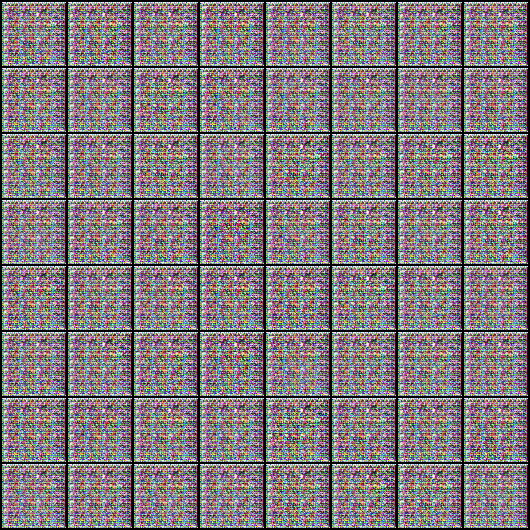

In [38]:
Image('/content/generated/generated-images-0999.png')

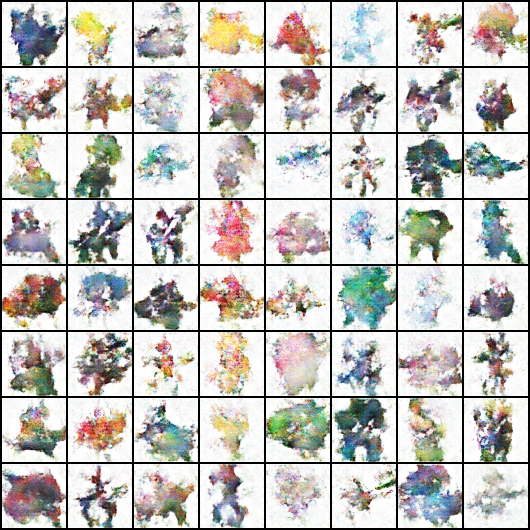

In [47]:
Image('/content/generated/generated-images-0575.png')

In [40]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

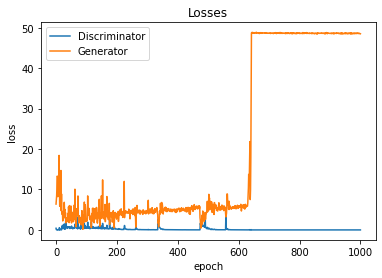

In [41]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

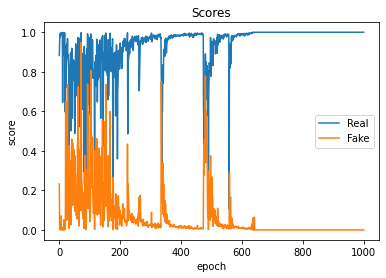

In [42]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');